In [1]:
%load_ext lab_black
%load_ext autotime

import drnb.embed.pipeline as pl

time: 6.88 s (started: 2022-11-24 20:34:33 -08:00)


# Spectral Embedding

UMAP uses a spectral embedding for initialization: it's very close to being a Laplacian Eigenmap using the UMAP fuzzy simplicial set as the input sparse graph (the fuzzy set membership values being the weight of the edges between vertices). [Linderman and Steinerberger](https://arxiv.org/abs/1706.02582) suggested a connection between spectral clustering and the early exaggeration phase of t-SNE, so this turns out to be quite a good way to initialize an embedding, certainly better than random initialization. Also, compared to PCA-based approaches, this has the feature of being consistent with the rest of the embedding, as it's not using any more information than the optimization step uses. That could be seen as a downside as PCA effectively uses more of the data but:

* Using PCA doesn't make a lot of sense for non-Euclidean metrics. Maybe cosine is also ok given the monotonic relationship between the cosine distance and the Euclidean distance between normalized vectors.
* Using PCA enforces a global view of the data. This is not necessarily a bad thing, but you don't get to control the trade-off of local to global emphasis the initialization uses. For manifolds like the swiss roll, PCA will give you back the folded up form, which is much harder to unroll compared to the spectral initialization.
* You need the initial data around, not just the input graph.

So it's nice to have a principled way to initialize the embedding which can make use of the graph data that is already on hand. The main drawback with spectral initialization is that it can be a bit erratic. Fundamental to the solution is finding eigenvectors of a sparse and potential large matrix. If the matrix is not well-conditioned, then the solvers can fail. Worse, they can hang for unspecified amounts of time if things are going really badly. Disconnected components or close-to-disconnected components can be the cause of this, for which UMAP is at an elevated risk due to the default low number of nearest neighbors it calculates compared to e.g. t-SNE. But also well-connected graphs can cause the solvers problems if the underlying manifold has a high "aspect ratio", i.e. one of the axes has a large extent compared to the other axis. Points arranged along a line are a good example of a nightmare scenario for a spectral method. This aspect of spectral methods was first described by [Goldberg and co-workers](https://arxiv.org/abs/0806.2646). In general, this also means that structured low-dimensional manifolds that are often used as synthetic datasets to test dimensionality reduction can be misleading. For example, the mammoth dataset is much harder to generate a spectral embedding for compared to MNIST, despite mammoth having fewer items in it. For real-world data which tends to be messy and blobby, this isn't much of an issue, but there are some datasets like `tomoradar` which have problems.

I attempted to tweak the parameters of the ARPACK-based [`eigsh`](https://docs.scipy.org/doc/scipy/reference/generated/scipy.sparse.linalg.eigsh.html) solver used by UMAP to see if there was much that could be done, but that was rather difficult. An alternative strategy is to use truncated SVD to generate a rough initial guess to the eigenvectors (there is a [straightforward relationship](https://jlmelville.github.io/smallvis/spectral.html#Connection_Between_SVD_and_Spectral_Decomposition) between the singular vectors of the normalized symmetric graph Laplacian and the eigenvectors) and then feed that initial guess to the [`lobpcg`](https://docs.scipy.org/doc/scipy/reference/generated/scipy.sparse.linalg.lobpcg.html) solver. See [this PR](https://github.com/lmcinnes/umap/pull/924) for more details.

Using just the UMAP spectral initialization as an embedding method can be achieved with the `umapspectral` embedder. Some parameters:

* `n_neighbors` -- number of nearest neighbors to generate for the graph.
* `tsvdw` -- if `True`, use the truncated SVD "warmed" initialization with lobpcg as the solver. If `False` (the default), use `eigsh` as UMAP does internally.
* `tsvdw_tol` -- the tolerance for the `tsvdw` solver. Ignored if `tsvdw=False`. Default is `1e-5`, but you can probably get away with `1e-4` for most datasets.
* `jitter` -- if `True` (the default), the returned result is scaled and some noise added to the coordinates which is part of the typical UMAP initialization procedure. This should help avoid getting the result stuck in local minima when used for downstream optimization.

## Testing Some Parameters

Let's see what the effect of the tsvd-warmed initialization is and whether jittering has any particular visual effect. 

## Datasets

* [s1k](https://github.com/jlmelville/drnb/blob/46474e5918329fd9dd97bf3fc646d41558f8b2fa/notebooks/data-pipeline/s1k.ipynb): a small dataset of a fuzzy 9D simplex.
* [mnist](https://github.com/jlmelville/drnb/blob/46474e5918329fd9dd97bf3fc646d41558f8b2fa/notebooks/data-pipeline/mnist.ipynb): a large dataset with ten clusters.
* [mammoth](https://github.com/jlmelville/drnb/blob/46474e5918329fd9dd97bf3fc646d41558f8b2fa/notebooks/data-pipeline/mammoth.ipynb): a low-dimensional dataset which has a lot of fine structure. PCA does a good job on this.
* [isoswiss](https://github.com/jlmelville/drnb/blob/46474e5918329fd9dd97bf3fc646d41558f8b2fa/notebooks/data-pipeline/isoswiss.ipynb): a low-dimensional synthetic manifold. PCA does a *bad* job on this as it can't unroll it.

Let's see if jittering has a big effect on the visual output first:

In [2]:
eigsh_jitter = pl.create_pipeline(
    method=pl.embedder("umapspectral", params=dict(tsvdw=False, jitter=True)),
    eval_metrics=["rte", "rpc", ("nnp", dict(n_neighbors=[15, 50, 150]))],
)

eigsh_no_jitter = pl.create_pipeline(
    method=pl.embedder("umapspectral", params=dict(tsvdw=False, jitter=False)),
    eval_metrics=["rte", "rpc", ("nnp", dict(n_neighbors=[15, 50, 150]))],
)

time: 273 ms (started: 2022-11-24 15:29:06 -08:00)


[15:29:20] INFO     Loading faiss with AVX2 support.                                                   ]8;id=262713;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py\loader.py]8;;\:]8;id=150742;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py#54\54]8;;\

           INFO     Could not load library with AVX2 support due to:                                   ]8;id=287985;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py\loader.py]8;;\:]8;id=830173;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py#58\58]8;;\
                    ModuleNotFoundError("No module named 'faiss.swigfaiss_avx2'")                                  

           INFO     Loading faiss.                                                                     ]8;id=215508;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py\loader.py]8;;\:]8;id=871322;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py#64\64]8;;\

           INFO     Successfully loaded faiss.                                                         ]8;id=83400;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py\loader.py]8;;\:]8;id=788598;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py#66\66]8;;\

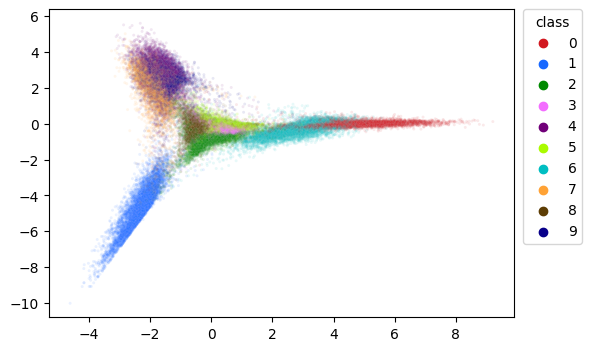

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.5896542857142858, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.21972153864627242, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.01537333333333333, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.032007714285714285, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.06206380952380953, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 17.7 s (started: 2022-11-24 15:29:09 -08:00)


In [3]:
eigsh_jitter.run("mnist")["evaluations"]

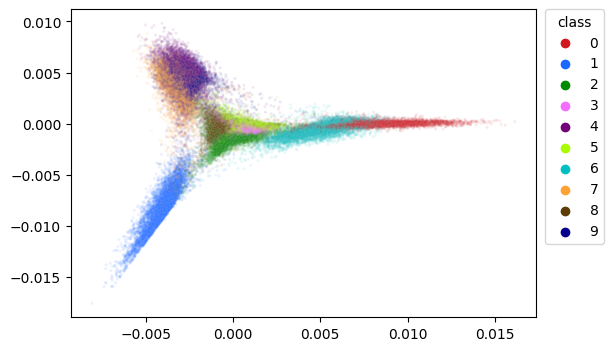

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.5896571428571429, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.21972156344369886, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.015362857142857143, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.032008571428571435, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.062067047619047626, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 14.5 s (started: 2022-11-24 15:29:47 -08:00)


In [4]:
eigsh_no_jitter.run("mnist")["evaluations"]

Obviously the axes change, but the actual results (and metrics) aren't affected. One more test with `mammoth`:

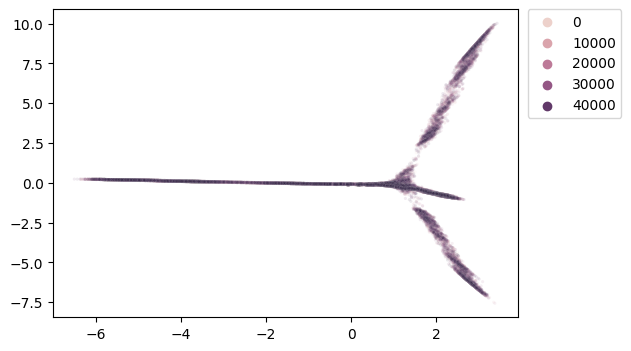

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.778108, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.6498401062522455, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.07488266666666667, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.10643320000000002, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.15221426666666665, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 1min 16s (started: 2022-11-24 15:30:01 -08:00)


In [5]:
eigsh_jitter.run("mammoth")["evaluations"]

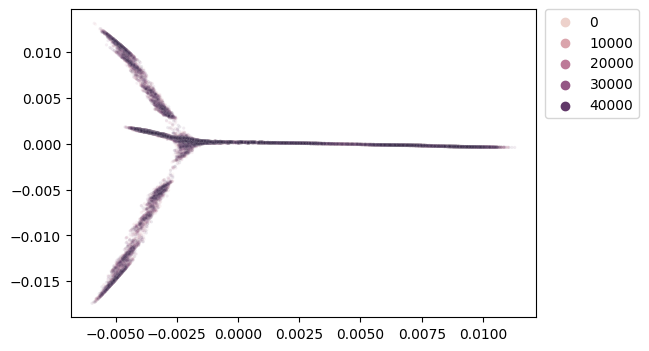

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.7781040000000001, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.6498398756725899, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.07480133333333332, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.10638280000000003, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.15219200000000002, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 1min 15s (started: 2022-11-24 15:31:17 -08:00)


In [6]:
eigsh_no_jitter.run("mammoth")["evaluations"]

Again, no change. So for the rest of this we will not adjust the `jitter` parameter.

## Effect of truncated SVD

In [7]:
tsvdw_jitter = pl.create_pipeline(
    method=pl.embedder("umapspectral", params=dict(tsvdw=True, jitter=True)),
    eval_metrics=["rte", "rpc", ("nnp", dict(n_neighbors=[15, 50, 150]))],
)

time: 2.51 ms (started: 2022-11-24 15:32:32 -08:00)


### s1k

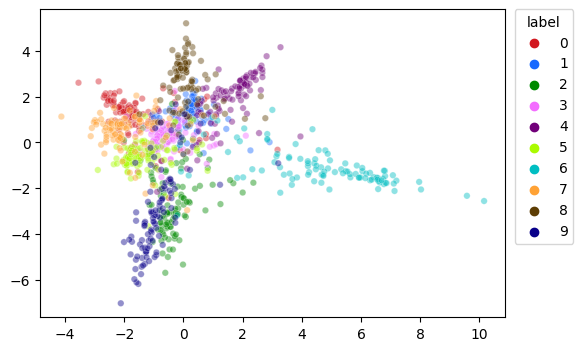

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.597, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.22740124674897566, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.16013333333333332, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.30244000000000004, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.4134133333333333, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 1.56 s (started: 2022-11-24 15:32:32 -08:00)


In [8]:
eigsh_jitter.run("s1k")["evaluations"]

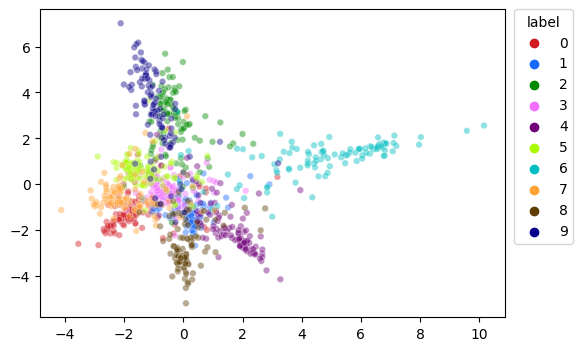

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.597, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.22740368345626533, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.16006666666666666, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.30248, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.4134333333333333, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 1.67 s (started: 2022-11-24 15:32:34 -08:00)


In [9]:
tsvdw_jitter.run("s1k")["evaluations"]

### MNIST

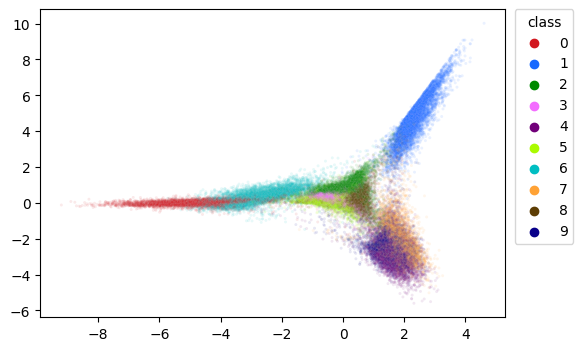

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.5896428571428571, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.21970739544929152, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.015395238095238096, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.03199114285714286, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.06203257142857142, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 9.69 s (started: 2022-11-24 15:32:36 -08:00)


In [10]:
tsvdw_jitter.run("mnist")["evaluations"]

### mammoth

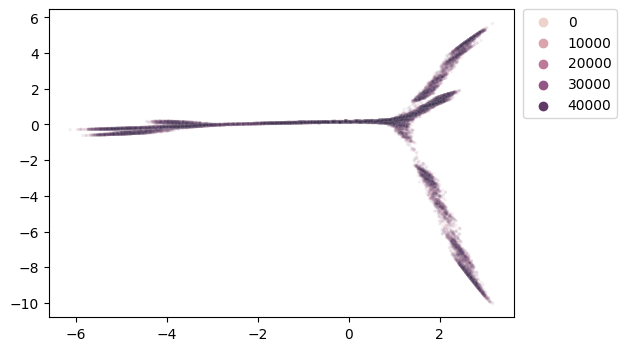

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.7809440000000001, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.6420848437237494, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.082704, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.11705480000000001, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.17069866666666664, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 19.1 s (started: 2022-11-24 15:32:45 -08:00)


In [11]:
tsvdw_jitter.run("mammoth")["evaluations"]

### isoswiss

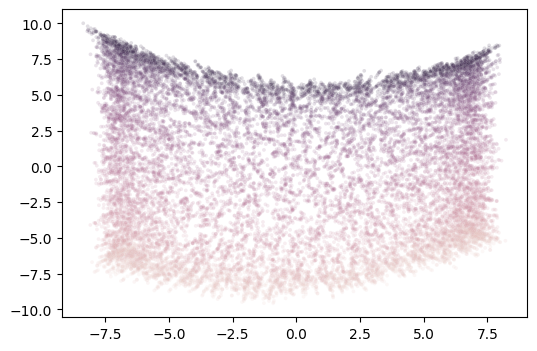

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.74324, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.6310533450597872, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.3249466666666667, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.42345, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.5567060000000001, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 15.9 s (started: 2022-11-24 15:33:05 -08:00)


In [12]:
eigsh_jitter.run("isoswiss")["evaluations"]

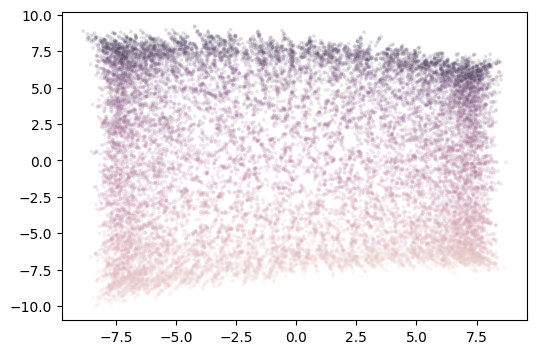

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.7525400000000001, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.6487825313731567, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.32517333333333337, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.42504200000000003, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.5601096666666667, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 3.34 s (started: 2022-11-24 15:33:20 -08:00)


In [13]:
tsvdw_jitter.run("isoswiss")["evaluations"]

### Summary

* Visually, there is not a lot to choose between any of the settings. Biggest visual difference is for `mammoth`.
* The scaling obviously changes the scale of the axes, but the jittering has no obvious visual effect, so we don't need to worry about that going forward: we'll just leave `jitter=True`.
* All the evaluation metrics are basically the same for all the settings.
* For `mammoth`, using the tsvd-warmed solver is noticeably quicker. Bear in mind some of the run time is from the evaluations, but there is a still a detectable difference compared to `mnist`.

## Binary Edge Weights

Do we actually need the UMAP weights for this initialization? The actual optimization for neighbor embeddings like doesn't seem to need it for either t-SNE (see Figure 3 of work by [Böhm and co-workers](https://www.jmlr.org/papers/v23/21-0055.html)) or UMAP (see section 6 of work by [Damrich and Hamprecht](https://arxiv.org/abs/2103.14608)).

Set `binary_edge_weights=True` to use binary edge weights.

In [27]:
eigsh_binary = pl.create_pipeline(
    method=pl.embedder("bgspectral"),
    eval_metrics=["rte", "rpc", ("nnp", dict(n_neighbors=[15, 50, 150]))],
)

time: 2.01 ms (started: 2022-11-20 17:50:24 -08:00)


### s1k

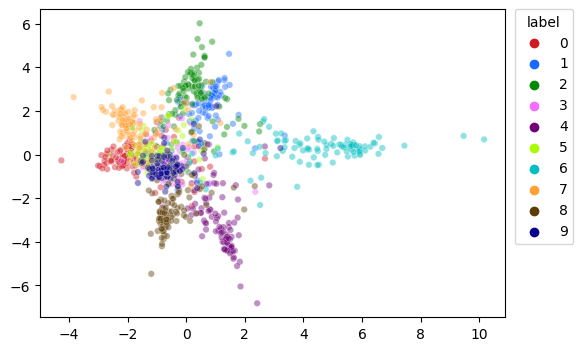

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.6032000000000001, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.23800153894406423, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.1512, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.29352, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.40010666666666667, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 1.54 s (started: 2022-11-20 17:19:33 -08:00)


In [4]:
eigsh_binary.run("s1k")["evaluations"]

### mnist

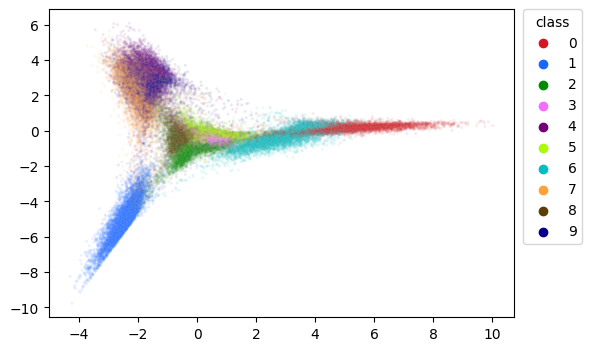

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.5930114285714286, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.24541012272926618, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.014768571428571428, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.03152571428571429, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.06168209523809523, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 15.1 s (started: 2022-11-23 20:32:56 -08:00)


In [85]:
eigsh_binary.run("mnist")["evaluations"]

### mammoth

I will check whether `tsvdw=True` holds up here in terms of speed and if the results are similar.

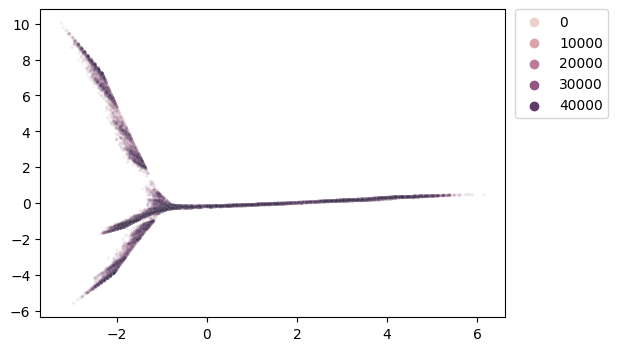

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.782948, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.6458824217180146, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.12232933333333333, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.13832000000000003, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.17236693333333336, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 53.1 s (started: 2022-11-20 17:20:03 -08:00)


In [6]:
eigsh_binary.run("mammoth")["evaluations"]

A very slight visual difference to the UMAP weighted version. But metrics aren't worse. Local ones (nearest neighbor preservation) seem better in fact.

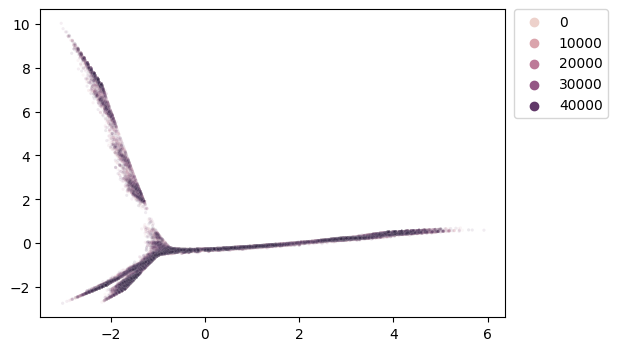

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.778628, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.6248381820848187, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.1242933333333333, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.1365068, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.16734079999999998, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 11.2 s (started: 2022-11-20 17:20:56 -08:00)


In [7]:
pl.create_pipeline(
    method=pl.embedder("bgspectral", params=dict(tsvdw=True)),
    eval_metrics=["rte", "rpc", ("nnp", dict(n_neighbors=[15, 50, 150]))],
).run("mammoth")["evaluations"]

This does show a larger visual difference. But again, the evaluation results are very close.

### isoswiss

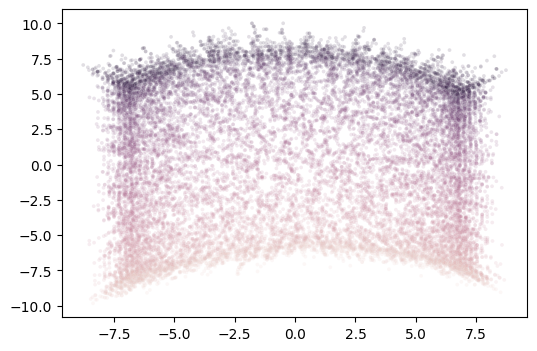

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.74681, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.6460218141722271, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.31472, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.42395999999999995, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.5549693333333333, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 7.67 s (started: 2022-11-22 22:25:11 -08:00)


In [48]:
eigsh_binary.run("isoswiss")["evaluations"]

This also seems fine. The nnp15 (preservation of 15-nearest neighbors) is perhaps slightly lower, but everything else is ok, and visually it's still unfolded. What is most apparent is the "banding" effect. There is perhaps a hint of it in the `mammoth` image too, but it's much easier to see here.

## Adding Random Neighbors

If some of the convergence issues seen with spectral initialization are due to a lack of connected components, could we add *just enough* extra edges to a k-nearest neighbor graph to get full connectivity without perturbing the results too much? How many do we need? See for example [this lecture PDF](https://people.eecs.berkeley.edu/~jfc/cs174/lecs/lec9/lec9.pdf) which gives the basic theory that says if you randomly connect neighbors in a graph, you need about $N \log N$ edges to have a high probability of having a fully connected graph. [Linderman and co-workers](https://arxiv.org/abs/1711.04712) suggest you need even fewer than that: $N \log \log N$. The [ivhd](https://arxiv.org/abs/1902.01108) method by Dzwinel and co-workers suggests a multi-dimensional scaling approach that uses nearest neighbors and then a random sampling of random neighbors that gives pretty decent layouts.

All of the above suggests that we have a reasonable chance of creating a connected graph without having to add on a large number of extra edges. Next question: how do we combine a knn and a random graph? For `bgspectral` it's pretty straightforward: add the two sparse matrices. If they are both symmetric then the addition will still be symmetrics. Also, we can easily control how much influence we want the random graph to have by setting the edge weights of the random graph relative to the neighbor graph: in this case, a small positive number less than 1.

For `umapspectral` it's a bit more complicated because the fuzzy simplicial set is defined using an exponential kernel. If we just plug random neighbors into that, even if we turn down the local connectivity constraint, we could have random neighbors with edge weights which are larger than the edge weights between nearest neighbors in the knn graph. That doesn't seem ideal. Also, we are now dealing with fuzzy sets, so it would make more sense to appeal to the idea of fuzzy set operations, which for intersection generalizes to t-norms. From the [wikipedia page on t-norms](https://en.wikipedia.org/wiki/T-norm), it does seem that the bounded sum would be a justifiable approach. But that's not the union or intersection operation used by UMAP, so let's come back to that later.

### 5 random neighbors, edge weight $10^{-3}$

In [35]:
gspectral = pl.create_pipeline(
    method=pl.embedder(
        "bgspectral",
        params=dict(
            global_neighbors="random", n_global_neighbors=5, global_weight=0.001
        ),
    ),
    eval_metrics=["rte", "rpc", ("nnp", dict(n_neighbors=[15, 50, 150]))],
)

time: 4.46 ms (started: 2022-11-22 08:34:36 -08:00)


#### s1k

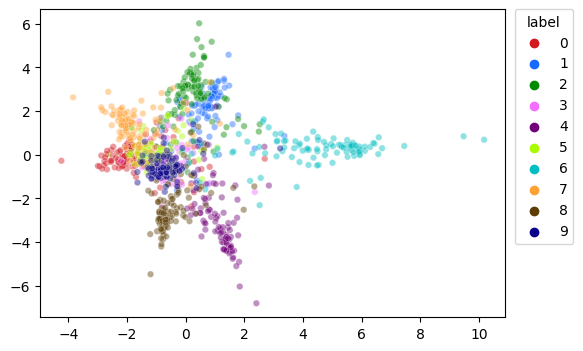

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.603, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.23762099679061904, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.15166666666666664, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.2936, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.3997733333333333, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 1.68 s (started: 2022-11-22 08:34:36 -08:00)


In [36]:
gspectral.run("s1k")["evaluations"]

#### mnist

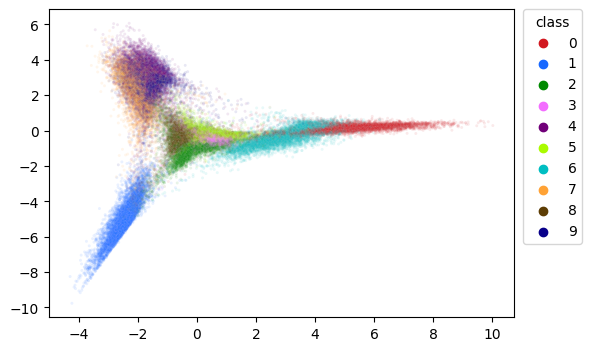

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.5929371428571428, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.2452021662074651, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.014780952380952379, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.031534000000000006, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.061666476190476195, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 18.7 s (started: 2022-11-23 20:33:53 -08:00)


In [87]:
gspectral.run("mnist")["evaluations"]

#### mammoth

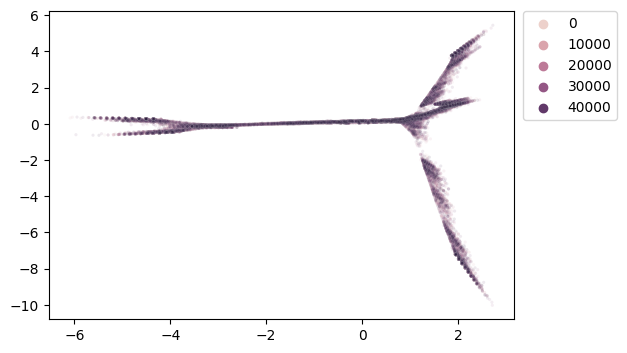

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.7773920000000001, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.6433779030562049, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.14167866666666667, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.15785720000000003, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.19047266666666665, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 39.5 s (started: 2022-11-22 08:34:57 -08:00)


In [38]:
gspectral.run("mammoth")["evaluations"]

And let's see how using the truncated SVD solver works:

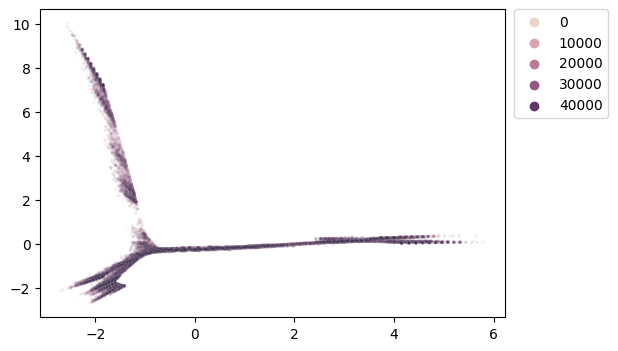

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.774556, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.6205450189523602, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.13587333333333332, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.1475836, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.17625946666666667, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 14.7 s (started: 2022-11-24 19:20:54 -08:00)


In [86]:
pl.create_pipeline(
    method=pl.embedder(
        "bgspectral",
        params=dict(
            global_neighbors="random",
            n_global_neighbors=5,
            global_weight=0.001,
            tsvdw=True,
        ),
    ),
    eval_metrics=["rte", "rpc", ("nnp", dict(n_neighbors=[15, 50, 150]))],
).run("mammoth")["evaluations"]

Looks a bit different, but the metrics aren't massively affected and it *is* still faster.

#### isoswiss

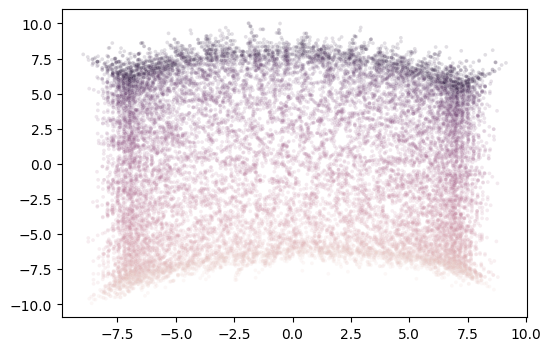

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.7505700000000001, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.6520309029900296, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.3166433333333334, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.426745, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.5583723333333335, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 7.07 s (started: 2022-11-22 22:26:34 -08:00)


In [50]:
gspectral.run("isoswiss")["evaluations"]

Everything seems to be in order, visually and in terms of metrics. And the runtime of `mammoth` is further improved. For `mnist`, the runtime is slightly increased but not to an extent that I find concerning.

### 5 random neighbors, edge weight $10^{-2}$

How sensitive are the results to the edge weight of the random neighbors?

In [92]:
gspectral001 = pl.create_pipeline(
    method=pl.embedder(
        "bgspectral",
        params=dict(
            global_neighbors="random", n_global_neighbors=5, global_weight=0.01
        ),
    ),
    eval_metrics=["rte", "rpc", ("nnp", dict(n_neighbors=[15, 50, 150]))],
)

time: 4.76 ms (started: 2022-11-23 20:47:22 -08:00)


#### s1k

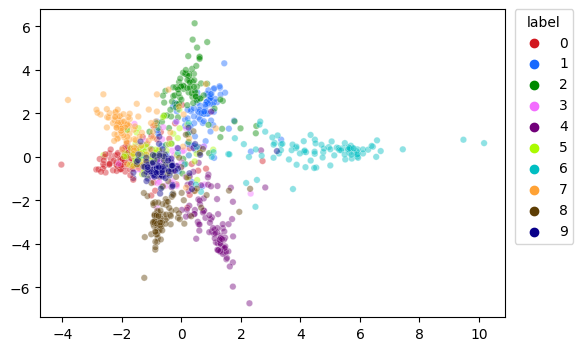

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.6038, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.2341306718207679, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.1501333333333333, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.29314000000000007, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.3977, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 1.73 s (started: 2022-11-23 20:47:22 -08:00)


In [93]:
gspectral001.run("s1k")["evaluations"]

#### mnist

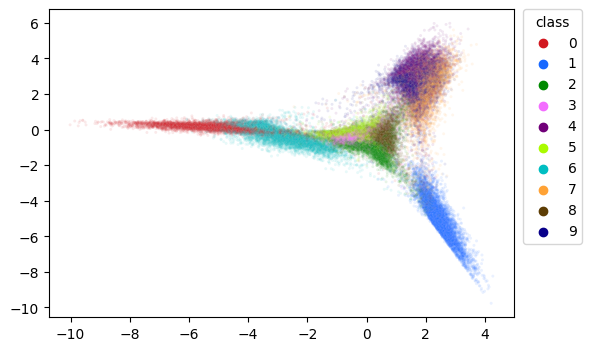

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.5923771428571428, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.24336549338967833, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.014729523809523812, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.031518285714285714, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.06160923809523809, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 18.6 s (started: 2022-11-23 20:48:02 -08:00)


In [94]:
gspectral001.run("mnist")["evaluations"]

#### mammoth

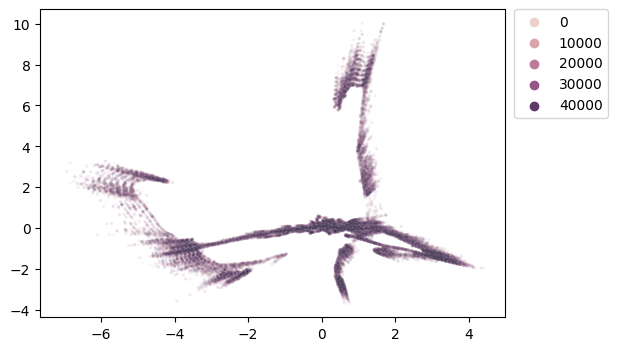

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.74822, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.5814161670415579, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.16534133333333334, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.2074364, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.2653236, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 35.3 s (started: 2022-11-23 20:48:24 -08:00)


In [95]:
gspectral001.run("mammoth")["evaluations"]

This actually does look different. Not entirely sure if it's *better*, bur certainly different. Local metrics are actually better compared to the `global_weight=0.001` results, at the expense of slightly reduced global metrics.

#### isoswiss

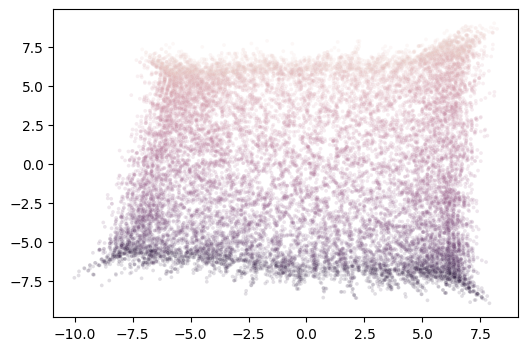

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.7554800000000002, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.6568257389120922, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.32343, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.434777, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.5665190000000001, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 6.43 s (started: 2022-11-23 20:49:52 -08:00)


In [96]:
gspectral001.run("isoswiss")["evaluations"]

### 5 random neighbors, edge weight $10^{-1}$

In [97]:
gspectral01 = pl.create_pipeline(
    method=pl.embedder(
        "bgspectral",
        params=dict(global_neighbors="random", n_global_neighbors=5, global_weight=0.1),
    ),
    eval_metrics=["rte", "rpc", ("nnp", dict(n_neighbors=[15, 50, 150]))],
)

time: 5.03 ms (started: 2022-11-23 21:03:31 -08:00)


#### s1k

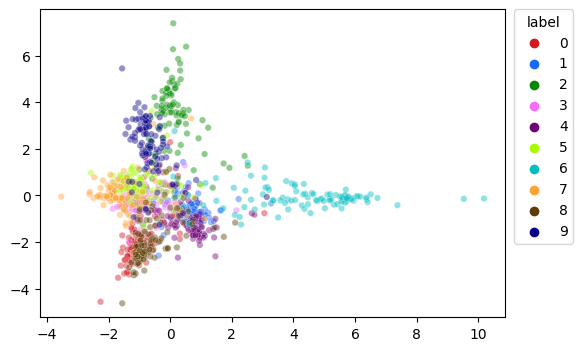

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.602, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.20863189482743355, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.14813333333333334, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.27708000000000005, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.3936733333333333, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 2.36 s (started: 2022-11-23 21:03:34 -08:00)


In [98]:
gspectral01.run("s1k")["evaluations"]

#### mnist

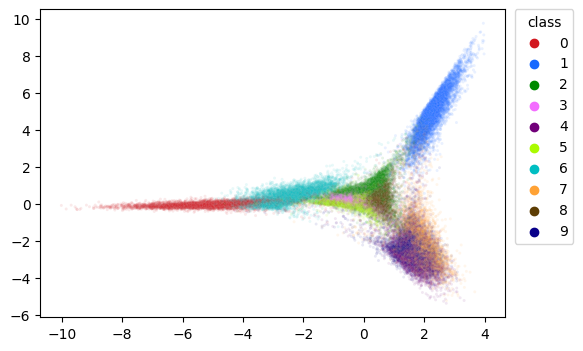

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.5878342857142856, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.22739952037031919, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.01252952380952381, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.027730857142857144, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.05664285714285714, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 20.5 s (started: 2022-11-23 21:07:57 -08:00)


In [104]:
gspectral01.run("mnist")["evaluations"]

#### mammoth

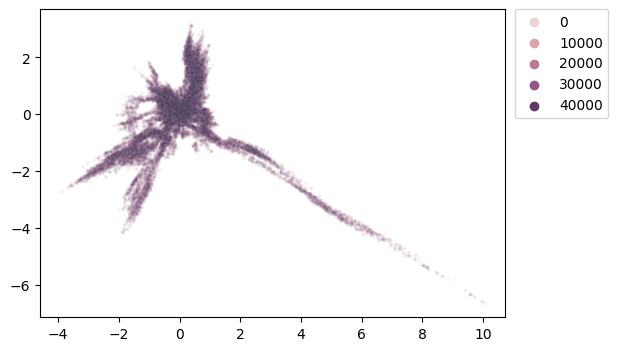

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.6447360000000001, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.2644489025172104, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.09233866666666667, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.14352720000000002, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.19039933333333334, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 16.1 s (started: 2022-11-23 21:04:08 -08:00)


In [100]:
gspectral01.run("mammoth")["evaluations"]

Well, looks like we finally broke `mammoth`.

#### isoswiss

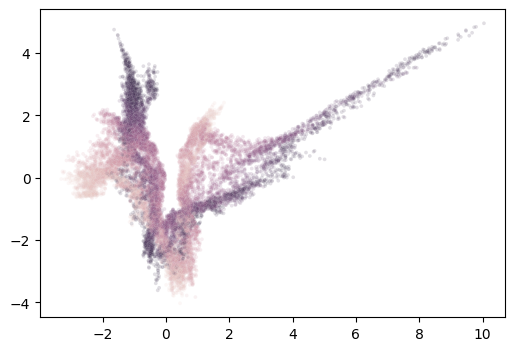

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.60749, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.30965753269384544, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.16765, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.24924500000000002, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.331987, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 5.02 s (started: 2022-11-23 21:04:24 -08:00)


In [101]:
gspectral01.run("isoswiss")["evaluations"]

and `isoswiss` too.

## Mid-near "global" neighbors

Wang and co-workers describe [PaCMAP](https://jmlr.org/papers/v22/20-1061.html) ([github repo](https://github.com/YingfanWang/PaCMAP)), which has a noticeable feature of adding a third type of edge to the optimization, beyond edges between neighbors and edges between random points. An intermediate type, "mid-near" neighbors are used. These are roughly sampled from the top 16%-33% of distances, and by default about half as many as the near neighbors are used. That's a bit higher proportion than the number of random neighbors we've used so far, but it's in the same ballpark. So what happens if instead of using 5 random neighbors, we use 5 mid-near neighbors per item?

In [116]:
mgspectral0001 = pl.create_pipeline(
    method=pl.embedder(
        "bgspectral",
        params=dict(
            global_neighbors="mid_near", n_global_neighbors=5, global_weight=0.001
        ),
    ),
    eval_metrics=["rte", "rpc", ("nnp", dict(n_neighbors=[15, 50, 150]))],
)

time: 3.41 ms (started: 2022-11-23 21:36:13 -08:00)


### 5 mid-near neighbors, edge weight $10^{-3}$

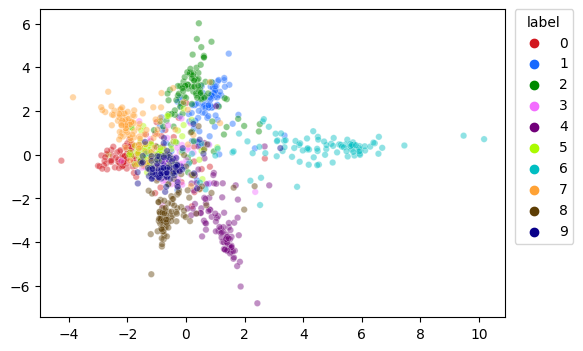

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.6032000000000001, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.238122415906715, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.15133333333333332, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.29364000000000007, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.40008000000000005, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 2.76 s (started: 2022-11-23 21:15:26 -08:00)


In [106]:
mgspectral0001.run("s1k")["evaluations"]

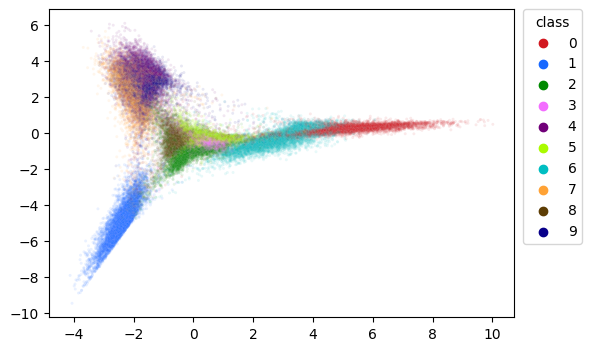

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.5944428571428572, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.25475359720282664, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.014586666666666666, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.03116485714285715, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.06115057142857143, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 34.2 s (started: 2022-11-23 21:15:29 -08:00)


In [107]:
mgspectral0001.run("mnist")["evaluations"]

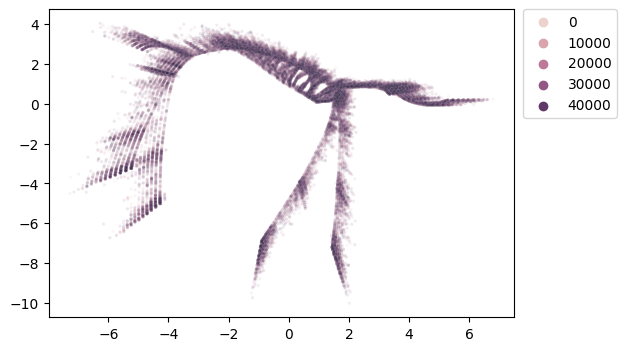

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.884484, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.9022052839672225, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.15439599999999998, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.18538200000000002, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.2463718666666667, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 32.8 s (started: 2022-11-23 21:16:03 -08:00)


In [108]:
mgspectral0001.run("mammoth")["evaluations"]

There is something distinctively mammoth-like emerging there. Intriguing. The metrics all concur that this is an improvement, too.

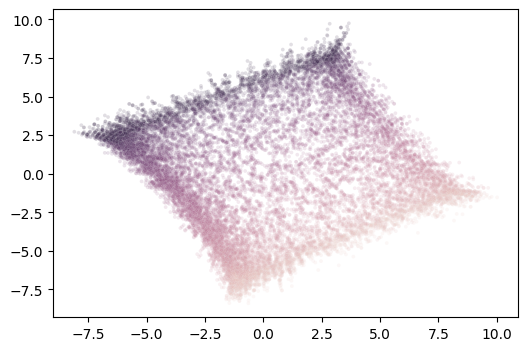

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.7743, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.7086003072029452, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.2982033333333334, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.40170500000000003, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.5252143333333333, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 8.92 s (started: 2022-11-23 21:16:36 -08:00)


In [109]:
mgspectral0001.run("isoswiss")["evaluations"]

The Swiss Roll holds up ok, maintaining its unfolded form.

### 5 random neighbors, edge weight $10^{-2}$

In [111]:
mgspectral001 = pl.create_pipeline(
    method=pl.embedder(
        "bgspectral",
        params=dict(
            global_neighbors="mid_near",
            n_global_neighbors=5,
            global_weight=0.01,
        ),
    ),
    eval_metrics=["rte", "rpc", ("nnp", dict(n_neighbors=[15, 50, 150]))],
)

time: 2.82 ms (started: 2022-11-23 21:17:55 -08:00)


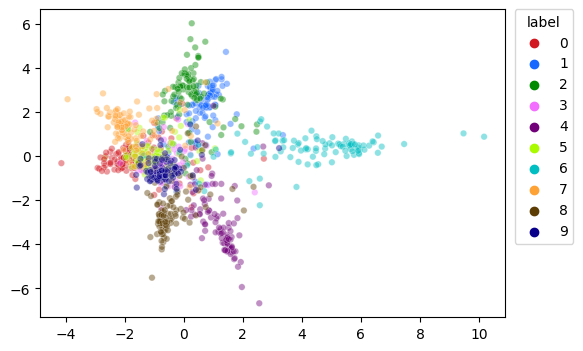

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.6038000000000001, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.23916886297678702, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.15073333333333333, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.29296000000000005, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.3992266666666667, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 1.58 s (started: 2022-11-23 21:18:25 -08:00)


In [114]:
mgspectral001.run("s1k")["evaluations"]

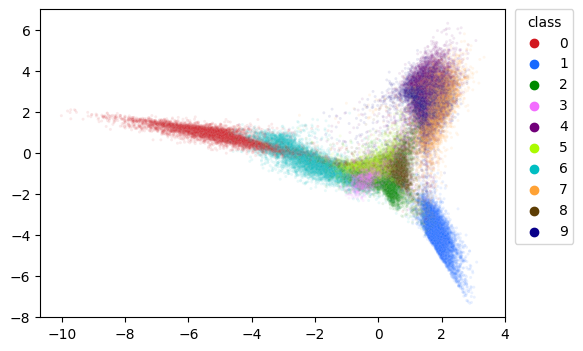

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.6081000000000001, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.33535258450454797, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.013298095238095239, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.028801714285714285, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.05711685714285714, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 23.5 s (started: 2022-11-23 21:18:26 -08:00)


In [115]:
mgspectral001.run("mnist")["evaluations"]

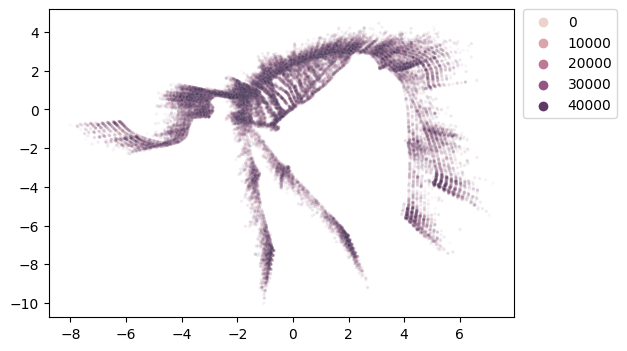

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.9101760000000001, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.9377855828497756, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.17532799999999998, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.21739040000000004, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.29554213333333335, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 19.1 s (started: 2022-11-23 21:18:00 -08:00)


In [112]:
mgspectral001.run("mammoth")["evaluations"]

This looks even more like a mammoth! And the metrics take another jump. The runtime is also very reasonable and much more like what I would expect, compared to where we started. So let's see what the truncated SVD approach does:

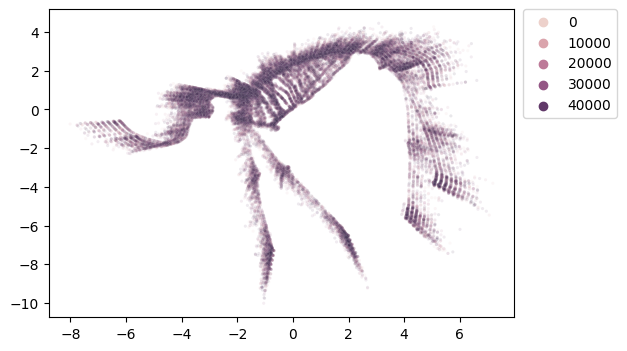

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.9101280000000002, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.9376557961575556, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.17530000000000004, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.2174268, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.2956068, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 14.9 s (started: 2022-11-24 13:35:29 -08:00)


In [127]:
pl.create_pipeline(
    method=pl.embedder(
        "bgspectral",
        params=dict(
            global_neighbors="mid_near",
            n_global_neighbors=5,
            global_weight=0.01,
            tsvdw=True,
        ),
    ),
    eval_metrics=["rte", "rpc", ("nnp", dict(n_neighbors=[15, 50, 150]))],
).run("mammoth")["evaluations"]

Same result, and the tsvd-based approach remains slightly faster, but not that much faster.

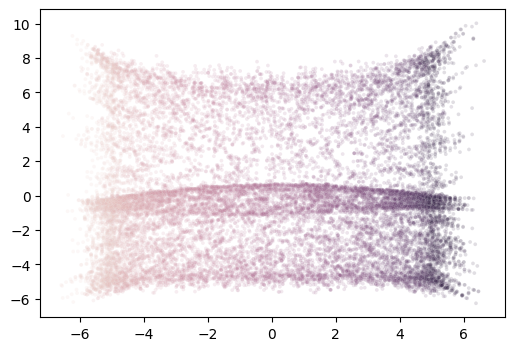

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.8296400000000002, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.8157816804494553, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.29463, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.37693000000000004, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.4641873333333333, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 5.74 s (started: 2022-11-23 21:18:19 -08:00)


In [113]:
mgspectral001.run("isoswiss")["evaluations"]

But the party is over for `isoswiss`. That band in the middle is what happens when the roll stays rolled up. You can see that the global metrics have improved to reflect that the 2D layout is closer to the 3D structure, but that's *not* what we want in this case. What's good for the mammoth is bad for the roll. This can also be diagnosed by the reduction in the local structure.

### 5 mid-near neighbors, edge weight $10^{-1}$

In [122]:
mgspectral01 = pl.create_pipeline(
    method=pl.embedder(
        "bgspectral",
        params=dict(
            global_neighbors="mid_near", n_global_neighbors=5, global_weight=0.1
        ),
    ),
    eval_metrics=["rte", "rpc", ("nnp", dict(n_neighbors=[15, 50, 150]))],
)

time: 3.34 ms (started: 2022-11-23 21:41:15 -08:00)


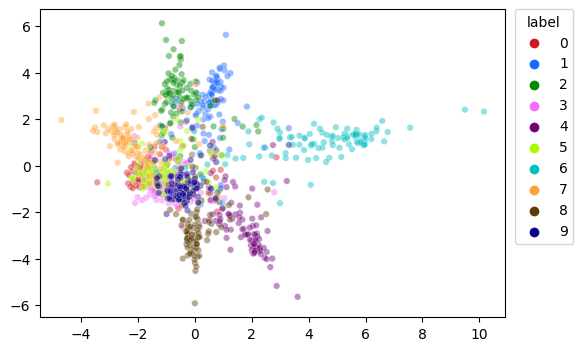

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.6032000000000001, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.24844893128250495, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.14806666666666665, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.28674, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.3941266666666667, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 1.57 s (started: 2022-11-23 21:41:15 -08:00)


In [123]:
mgspectral01.run("s1k")["evaluations"]

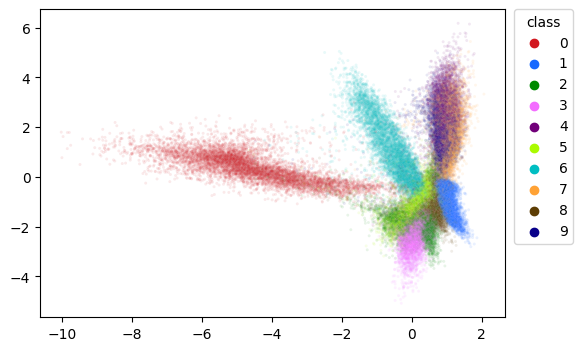

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.6680942857142856, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.532089199316061, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.015004761904761904, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.032966, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.06556838095238095, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 22.6 s (started: 2022-11-23 21:41:17 -08:00)


In [124]:
mgspectral01.run("mnist")["evaluations"]

`mnist`, which has reliably been doing nothing up to now, is finally changing. This seems like an interesting result: clusters are shifting about somewhat. The global and local metrics are both improved here.

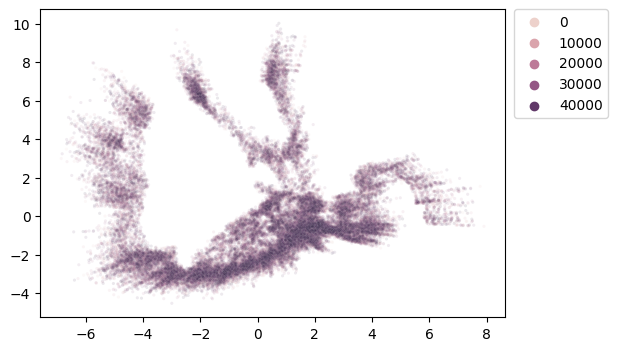

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.91076, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.9385712915408273, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.107576, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.17866560000000006, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.26968986666666667, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 13.6 s (started: 2022-11-23 21:41:39 -08:00)


In [125]:
mgspectral01.run("mammoth")["evaluations"]

`mammoth` still looks ok, but the metrics say we are now going in the wrong direction.

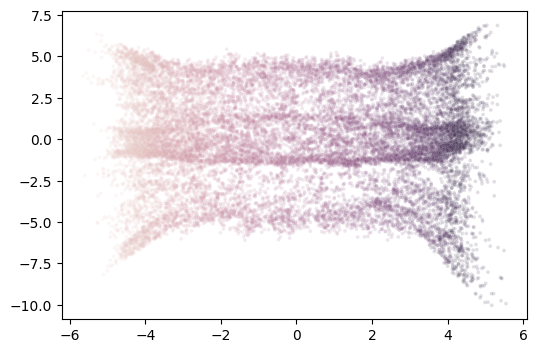

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.8366400000000002, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.8377915089802206, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.2351033333333334, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.330863, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.421779, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 5.02 s (started: 2022-11-23 21:41:53 -08:00)


In [126]:
mgspectral01.run("isoswiss")["evaluations"]

And this is not a great look for `isoswiss` compared to other initializations.

## UMAP combination

UMAP's take on combining different neighbors naturally lends itself to carrying out fuzzy set intersection or fuzzy set union. For intersection UMAP offers a weighting. For union, it does not, so you have less flexibility. We'll start with intersection first.

### Intersection 5 random neighbors, weight 0.1

In [15]:
ugspectral01 = pl.create_pipeline(
    method=pl.embedder(
        "umapspectral",
        params=dict(
            global_neighbors="random",
            op="intersection",
            n_global_neighbors=5,
            global_weight=0.1,
        ),
    ),
    eval_metrics=["rte", "rpc", ("nnp", dict(n_neighbors=[15, 50, 150]))],
)

time: 5.99 ms (started: 2022-11-24 16:16:52 -08:00)


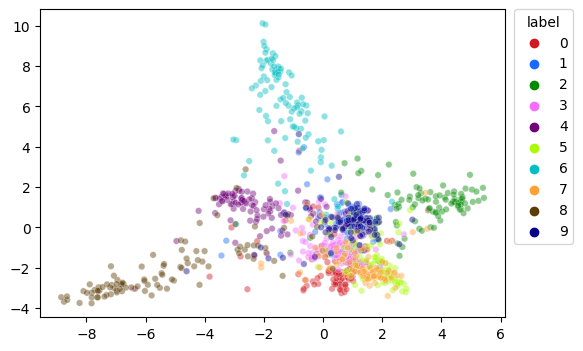

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.6046, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.2600030024925887, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.166, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.29875999999999997, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.40913333333333335, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 1.78 s (started: 2022-11-24 16:16:53 -08:00)


In [16]:
ugspectral01.run("s1k")["evaluations"]

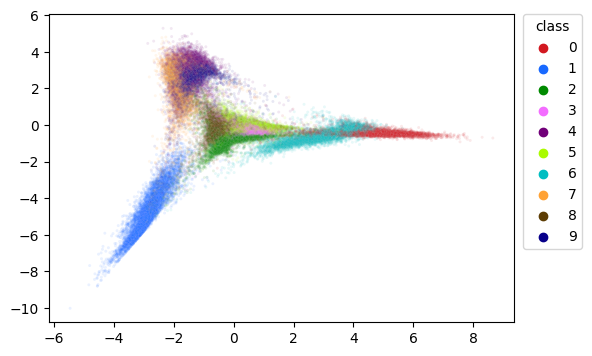

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.5962428571428572, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.23084205296402574, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.019114285714285716, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.03918571428571429, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.074932, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 19.7 s (started: 2022-11-24 16:16:54 -08:00)


In [17]:
ugspectral01.run("mnist")["evaluations"]

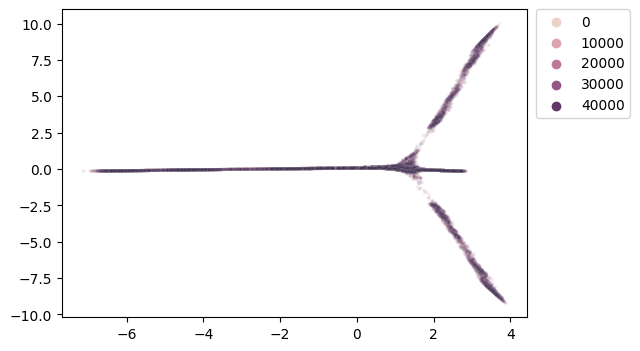

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.7752040000000001, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.6484660558592452, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.07950000000000002, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.12472000000000001, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.17703906666666666, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 1min 10s (started: 2022-11-24 16:17:14 -08:00)


In [18]:
ugspectral01.run("mammoth")["evaluations"]

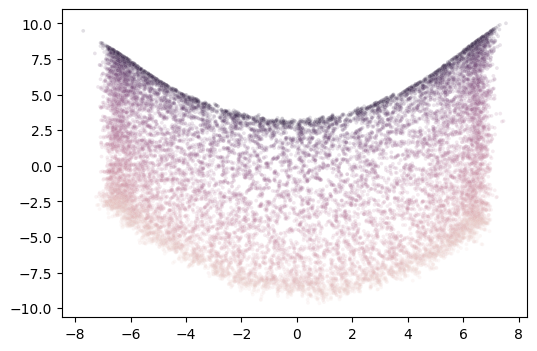

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.7112799999999999, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.5537501826579279, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.37946, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.48931100000000005, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.5992826666666666, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 8.24 s (started: 2022-11-24 16:18:24 -08:00)


In [19]:
ugspectral01.run("isoswiss")["evaluations"]

### Intersection 5 random neighbors, weight 0.25

In [27]:
ugspectral025 = pl.create_pipeline(
    method=pl.embedder(
        "umapspectral",
        params=dict(
            global_neighbors="random",
            op="intersection",
            n_global_neighbors=5,
            global_weight=0.25,
        ),
    ),
    eval_metrics=["rte", "rpc", ("nnp", dict(n_neighbors=[15, 50, 150]))],
)

time: 3.05 ms (started: 2022-11-24 16:38:03 -08:00)


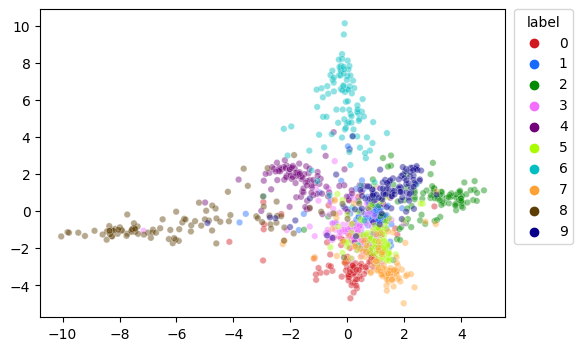

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.612, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.26645266848961524, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.17859999999999998, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.31804000000000004, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.4189533333333334, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 1.73 s (started: 2022-11-24 16:38:07 -08:00)


In [28]:
ugspectral025.run("s1k")["evaluations"]

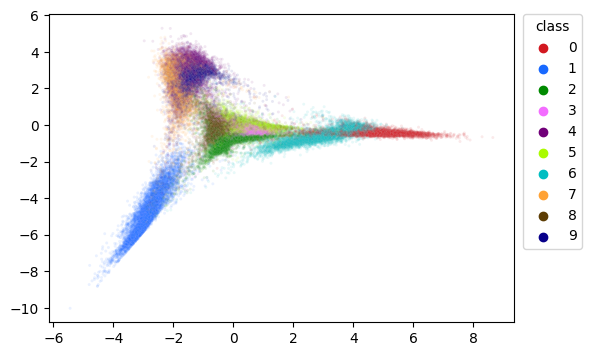

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.59628, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.23128089786634023, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.019130476190476187, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.03917000000000001, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.074886, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 17.8 s (started: 2022-11-24 16:38:12 -08:00)


In [29]:
ugspectral025.run("mnist")["evaluations"]

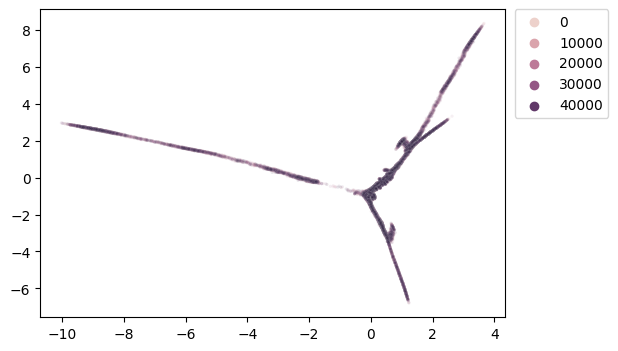

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.778904, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.5843102915324274, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.10922799999999999, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.1707696, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.2524884, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 50.8 s (started: 2022-11-24 16:38:30 -08:00)


In [30]:
ugspectral025.run("mammoth")["evaluations"]

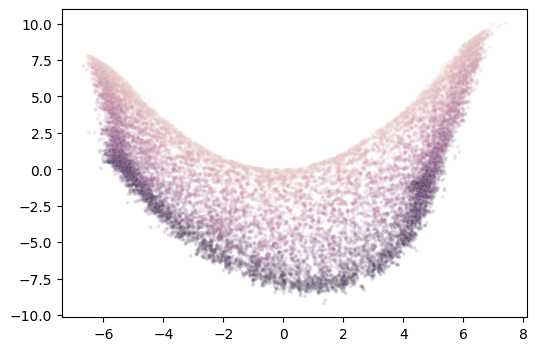

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.64397, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.39340843249807056, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.32543666666666665, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.41521899999999995, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.510826, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 8.41 s (started: 2022-11-24 16:39:21 -08:00)


In [31]:
ugspectral025.run("isoswiss")["evaluations"]

### Intersection 5 random neighbors, weight 0.5

In [21]:
ugspectral05 = pl.create_pipeline(
    method=pl.embedder(
        "umapspectral",
        params=dict(
            global_neighbors="random",
            op="intersection",
            n_global_neighbors=5,
            global_weight=0.5,
        ),
    ),
    eval_metrics=["rte", "rpc", ("nnp", dict(n_neighbors=[15, 50, 150]))],
)

time: 2.87 ms (started: 2022-11-24 16:36:05 -08:00)


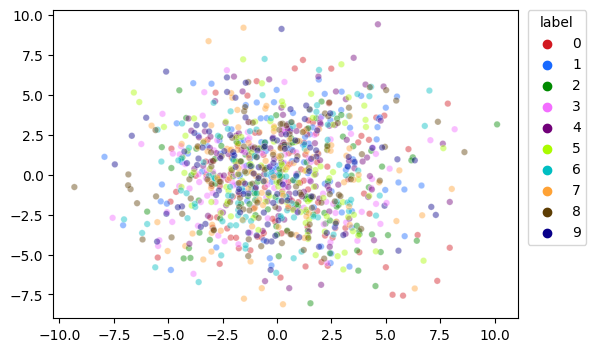

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.48460000000000003, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=-0.015448183303466687, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.0174, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.052860000000000004, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.1539, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 1.72 s (started: 2022-11-24 16:36:06 -08:00)


In [22]:
ugspectral05.run("s1k")["evaluations"]

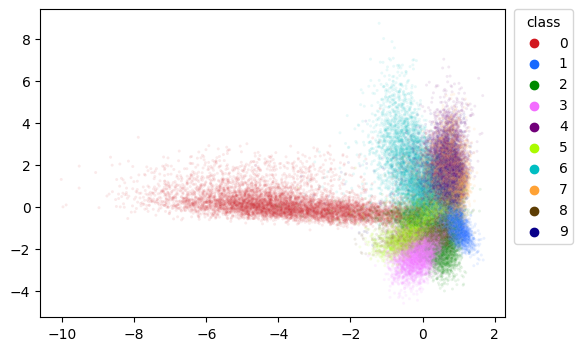

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.6773285714285715, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.5640524556536404, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.008643809523809524, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.018799142857142855, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.03920933333333334, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 17.6 s (started: 2022-11-24 16:36:08 -08:00)


In [23]:
ugspectral05.run("mnist")["evaluations"]

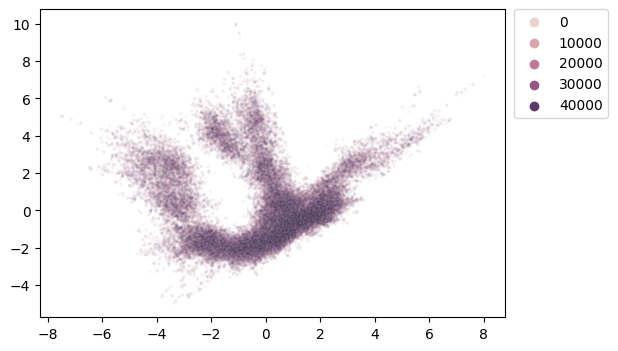

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.8829759999999999, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.920941300429259, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.034485333333333326, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.0511568, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.08605133333333333, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 10.2 s (started: 2022-11-24 16:36:26 -08:00)


In [24]:
ugspectral05.run("mammoth")["evaluations"]

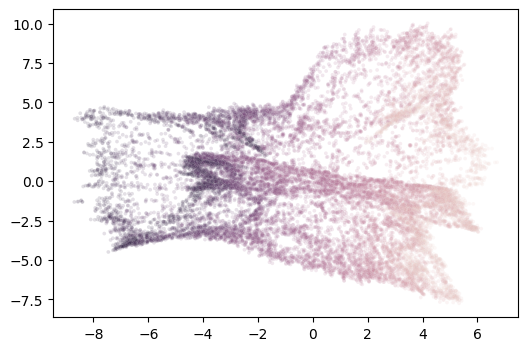

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.7995800000000001, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.7361112609813483, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.32109, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.37544500000000003, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.43171400000000004, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 7.94 s (started: 2022-11-24 16:36:36 -08:00)


In [25]:
ugspectral05.run("isoswiss")["evaluations"]

Looks like having equal weight of intersection between the nearest neighbors and random neighbors sets the weight too high. On the other hand, with `global_weight=0.25`, not much seems to happen, so it seems like there is a fairly small range where the intersection weight is valuable.

### Union 5 random neighbors

The union operator doesn't have a weight. Seems like this might not work too well if it behaves like the intersection, but let's find out.

In [32]:
ugspectralu = pl.create_pipeline(
    method=pl.embedder(
        "umapspectral",
        params=dict(
            global_neighbors="random",
            op="union",
            n_global_neighbors=5,
        ),
    ),
    eval_metrics=["rte", "rpc", ("nnp", dict(n_neighbors=[15, 50, 150]))],
)

time: 3.12 ms (started: 2022-11-24 16:40:27 -08:00)


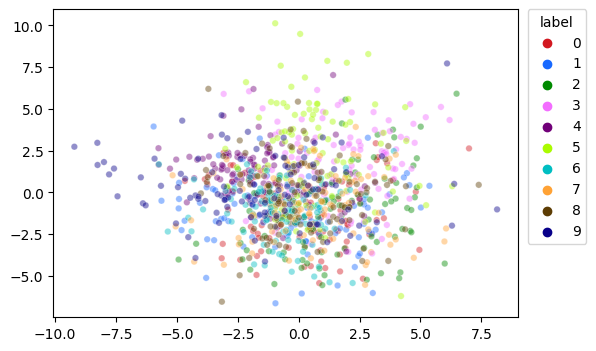

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.5367999999999999, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.05705221470359026, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.046200000000000005, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.09992000000000002, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.2119066666666667, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 2.05 s (started: 2022-11-24 16:40:30 -08:00)


In [33]:
ugspectralu.run("s1k")["evaluations"]

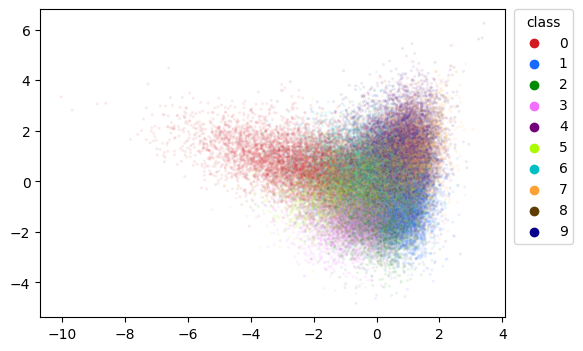

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.6046114285714286, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.35266584213535807, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.0015066666666666668, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.003392, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.008417428571428572, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 17.6 s (started: 2022-11-24 16:40:36 -08:00)


In [34]:
ugspectralu.run("mnist")["evaluations"]

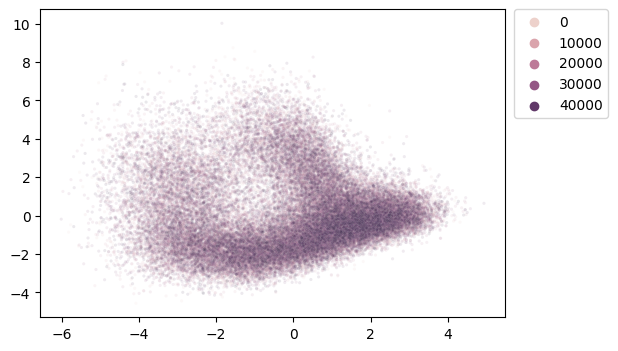

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.7799440000000001, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.7223447094859587, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.003128, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.007480400000000001, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.0193336, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 10.4 s (started: 2022-11-24 16:40:54 -08:00)


In [35]:
ugspectralu.run("mammoth")["evaluations"]

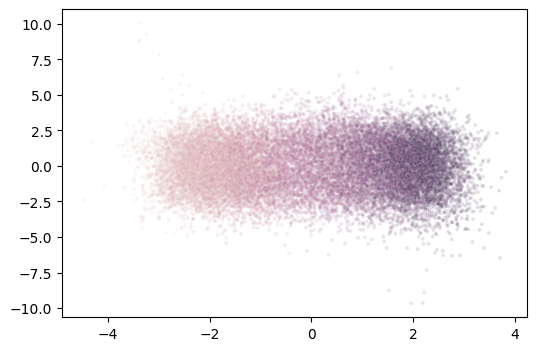

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.73896, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.6250542935279091, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.007560000000000001, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.017428000000000003, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.04427400000000001, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 3.89 s (started: 2022-11-24 16:41:04 -08:00)


In [36]:
ugspectralu.run("isoswiss")["evaluations"]

Unfortunately, it does seem that the union is not a good operator for combining nearest and random neighbor graphs. Perhaps if there is a way to add a weighting to the union, if it gets implemented in UMAP it might become a good choice.

## Increasing weight of intersection

The intersection weight seems a bit sensitive, as seen with `mammoth` going from `global_weight=0.25` to `global_weight=0.5`. Here are some intermediate values to see what happens:

In [67]:
def intersection_metrics(dataset, global_weight, global_neighbors="random"):
    return pl.create_pipeline(
        method=pl.embedder(
            "umapspectral",
            params=dict(
                global_neighbors=global_neighbors,
                op="intersection",
                n_global_neighbors=5,
                global_weight=global_weight,
            ),
        ),
        eval_metrics=["rte", "rpc", ("nnp", dict(n_neighbors=[15, 50, 150]))],
    ).run(dataset)["evaluations"]

time: 3.19 ms (started: 2022-11-24 17:45:04 -08:00)


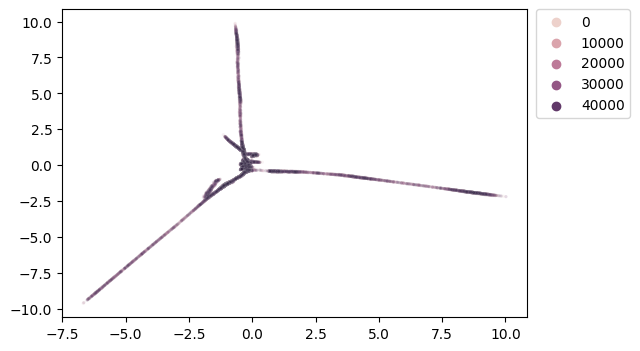

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.7445200000000002, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.49915607309254384, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.15832533333333332, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.23250960000000004, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.32101013333333334, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 42.4 s (started: 2022-11-24 17:25:33 -08:00)


In [55]:
intersection_metrics("mammoth", 0.3)

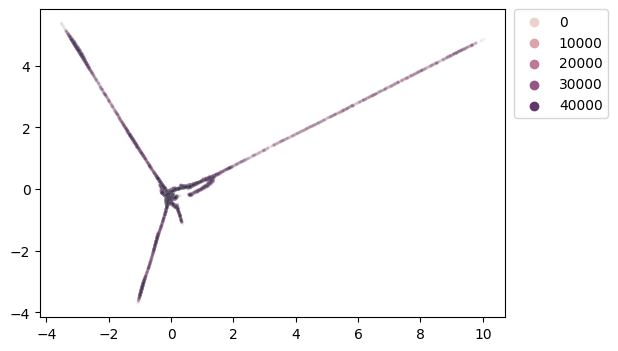

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.675012, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.4174610187658216, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.1405493333333333, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.20665840000000005, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.2900284, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 32.1 s (started: 2022-11-24 17:26:15 -08:00)


In [56]:
intersection_metrics("mammoth", 0.35)

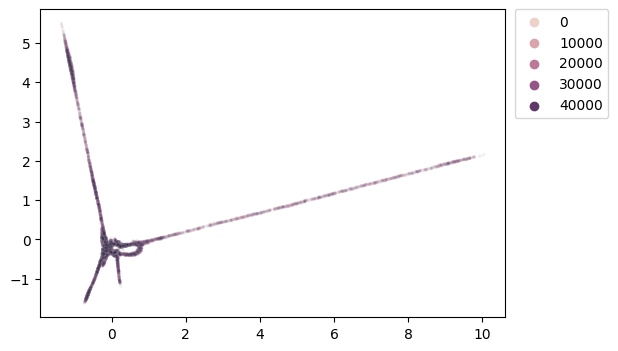

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.6364359999999999, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.3599783556663829, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.13124133333333332, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.19052280000000002, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.2599648, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 30.8 s (started: 2022-11-24 17:26:47 -08:00)


In [57]:
intersection_metrics("mammoth", 0.4)

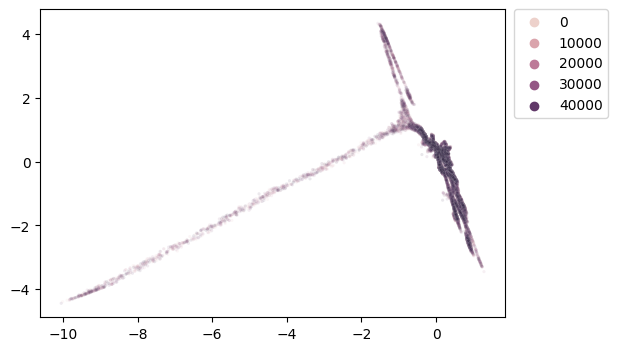

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.79656, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.617668538229732, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.15263333333333334, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.21414239999999998, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.2716882666666666, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 17.6 s (started: 2022-11-24 17:27:28 -08:00)


In [58]:
intersection_metrics("mammoth", 0.45)

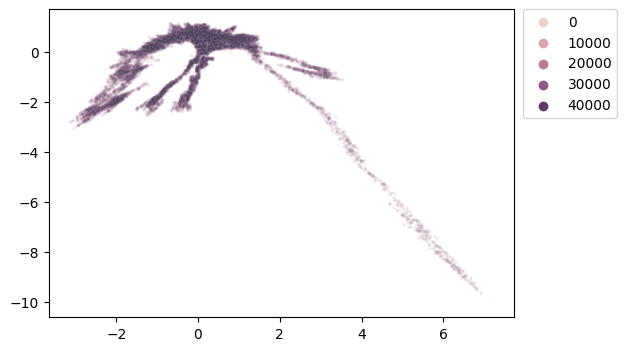

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.8740960000000001, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.7716595549995795, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.14074266666666665, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.19465880000000002, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.2563544, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 13.6 s (started: 2022-11-24 17:28:45 -08:00)


In [60]:
intersection_metrics("mammoth", 0.475)

It does seem like a lot happens between `global_weight=0.45` to `global_weight=0.5`. That doesn't seem to be the case for the other datasets, or rather the transition range occurs somewhere else.

## UMAP intersection with mid-near neighbors

Let's see if replacing with nearest neighbors with mid-near neighbors has a similar effect to the binarized edge weight initialization. Absolutely nothing of interest appears with `global_weight=0.1`, so I will show `global_weight=0.25`, `global_weight=0.45` and `global_weight=0.5` in order to demonstrate some images that look a bit different from previous examples.

### Intersection 5 mid-near neighbors, weight 0.25

In [37]:
mugspectral025 = pl.create_pipeline(
    method=pl.embedder(
        "umapspectral",
        params=dict(
            global_neighbors="mid_near",
            op="intersection",
            n_global_neighbors=5,
            global_weight=0.25,
        ),
    ),
    eval_metrics=["rte", "rpc", ("nnp", dict(n_neighbors=[15, 50, 150]))],
)

time: 2.97 ms (started: 2022-11-24 16:42:23 -08:00)


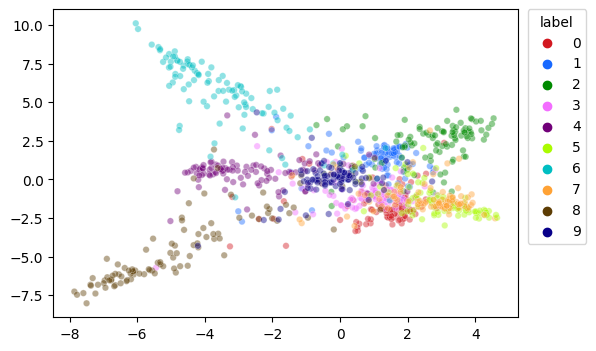

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.6093999999999999, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.27092193211437454, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.1694, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.30618, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.4196933333333333, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 1.75 s (started: 2022-11-24 16:42:27 -08:00)


In [38]:
mugspectral025.run("s1k")["evaluations"]

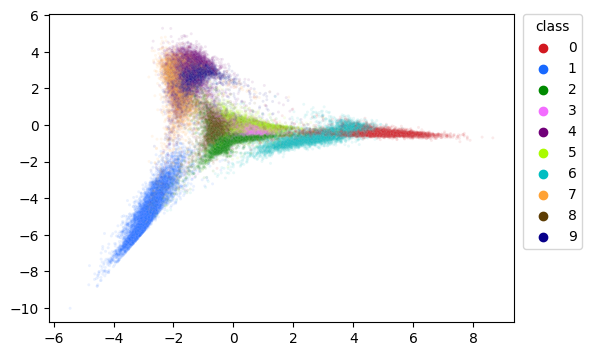

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.5963171428571429, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.231159441243146, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.019104761904761902, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.03915914285714287, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.074934, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 22.9 s (started: 2022-11-24 16:42:29 -08:00)


In [39]:
mugspectral025.run("mnist")["evaluations"]

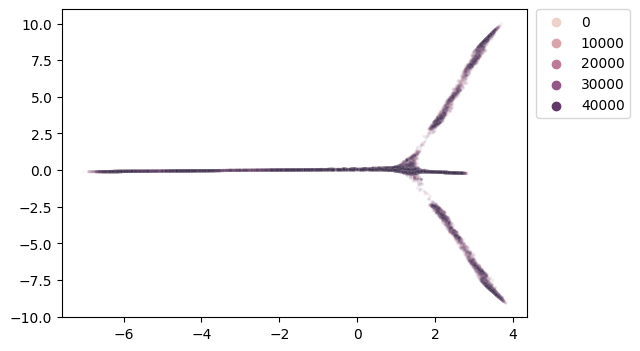

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.775536, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.6484611802380101, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.079792, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.12547640000000004, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.17805706666666665, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 1min 12s (started: 2022-11-24 16:42:52 -08:00)


In [40]:
mugspectral025.run("mammoth")["evaluations"]

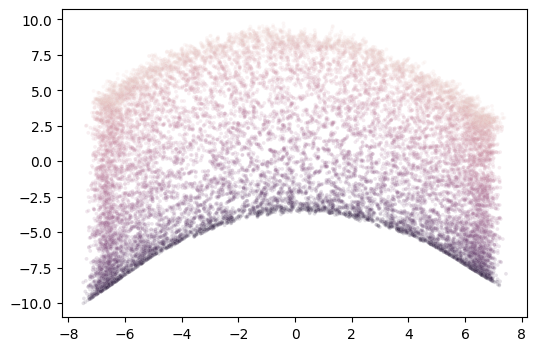

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.71639, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.5655998728061341, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.3823833333333334, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.493432, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.6045293333333334, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 10.3 s (started: 2022-11-24 16:44:05 -08:00)


In [41]:
mugspectral025.run("isoswiss")["evaluations"]

### Intersection 5 mid-near neighbors, weight 0.45

In [79]:
mugspectral045 = pl.create_pipeline(
    method=pl.embedder(
        "umapspectral",
        params=dict(
            global_neighbors="mid_near",
            op="intersection",
            n_global_neighbors=5,
            global_weight=0.45,
        ),
    ),
    eval_metrics=["rte", "rpc", ("nnp", dict(n_neighbors=[15, 50, 150]))],
)

time: 2.99 ms (started: 2022-11-24 18:14:53 -08:00)


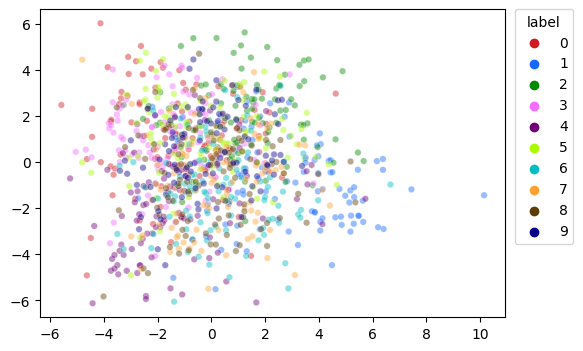

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.5621999999999999, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.20572438781563895, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.041133333333333334, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.10830000000000001, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.23547333333333337, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 1.73 s (started: 2022-11-24 18:14:56 -08:00)


In [80]:
mugspectral045.run("s1k")["evaluations"]

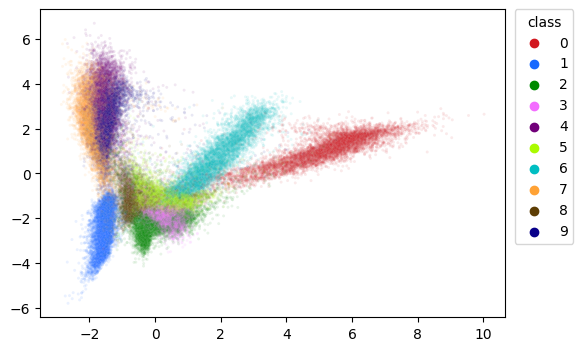

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.6497200000000001, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.4791589931670693, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.01832857142857143, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.03947371428571429, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.07820790476190476, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 23.7 s (started: 2022-11-24 18:15:02 -08:00)


In [81]:
mugspectral045.run("mnist")["evaluations"]

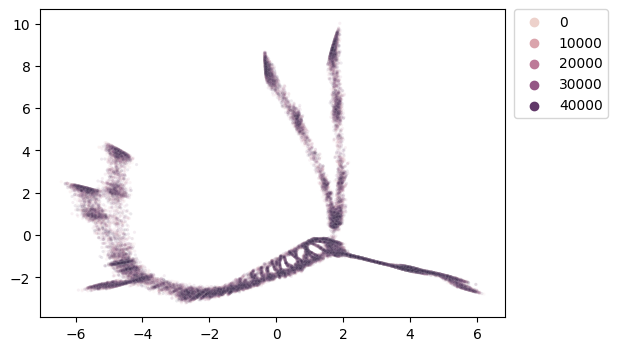

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.8614840000000002, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.8606890087259895, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.12165866666666665, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.18917120000000004, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.2684686666666667, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 43.6 s (started: 2022-11-24 18:15:25 -08:00)


In [82]:
mugspectral045.run("mammoth")["evaluations"]

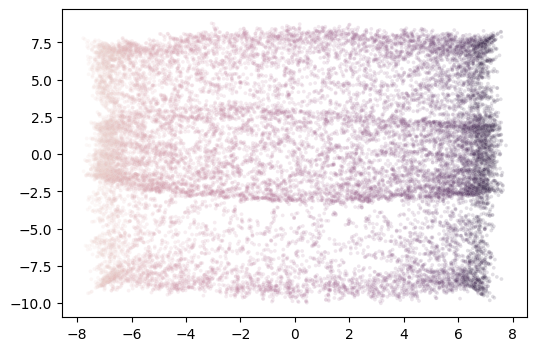

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.83147, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.8309399415126119, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.3087566666666667, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.37485100000000005, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.4482783333333334, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 7.61 s (started: 2022-11-24 18:16:09 -08:00)


In [83]:
mugspectral045.run("isoswiss")["evaluations"]

### Intersection 5 mid-near neighbors, weight 0.5

In [49]:
mugspectral05 = pl.create_pipeline(
    method=pl.embedder(
        "umapspectral",
        params=dict(
            global_neighbors="mid_near",
            op="intersection",
            n_global_neighbors=5,
            global_weight=0.5,
        ),
    ),
    eval_metrics=["rte", "rpc", ("nnp", dict(n_neighbors=[15, 50, 150]))],
)

time: 3.4 ms (started: 2022-11-24 16:46:49 -08:00)


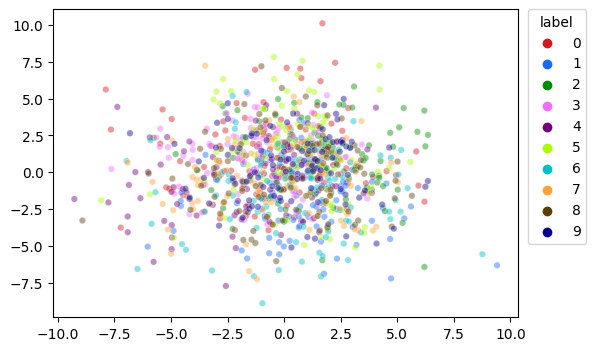

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.5202, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.07955160274886883, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.0246, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.06926, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.1843266666666667, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 1.73 s (started: 2022-11-24 16:46:55 -08:00)


In [50]:
mugspectral05.run("s1k")["evaluations"]

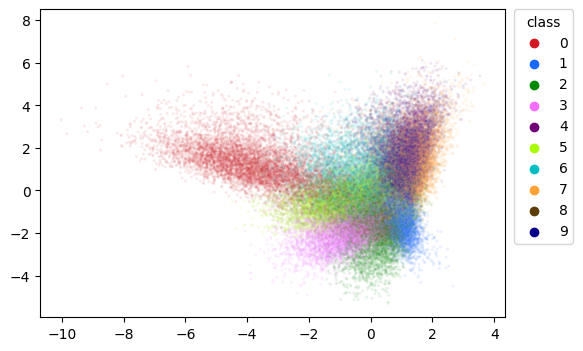

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.6912885714285714, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.5862180364367707, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.0060952380952380945, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.013604285714285716, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.029597142857142853, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 23 s (started: 2022-11-24 16:47:01 -08:00)


In [51]:
mugspectral05.run("mnist")["evaluations"]

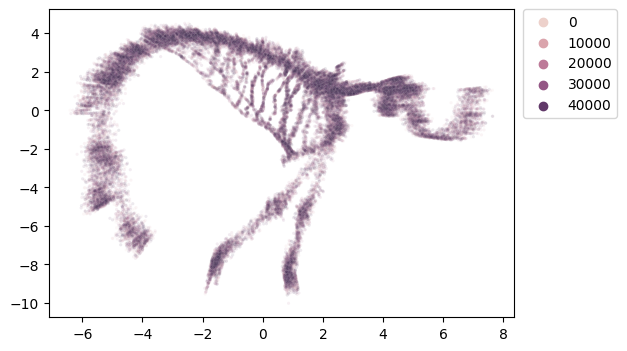

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.90544, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.9227325117555326, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.17692666666666668, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.24662080000000003, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.3281607999999999, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 21.6 s (started: 2022-11-24 16:47:24 -08:00)


In [52]:
mugspectral05.run("mammoth")["evaluations"]

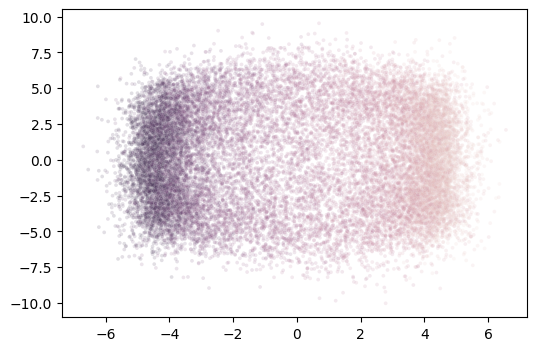

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.77569, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.7167186783709061, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.010873333333333336, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.028423, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.07407533333333333, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 7.1 s (started: 2022-11-24 16:47:46 -08:00)


In [53]:
mugspectral05.run("isoswiss")["evaluations"]

It seems like UMAP intersection of mid-near neighbors is able to produce similar results to the binary edge weight combination.

### Union 5 mid-near neighbors

I don't hold out a lot of hope for the union operation, but let's take a look:

In [42]:
mugspectralu = pl.create_pipeline(
    method=pl.embedder(
        "umapspectral",
        params=dict(
            global_neighbors="mid_near",
            op="union",
            n_global_neighbors=5,
        ),
    ),
    eval_metrics=["rte", "rpc", ("nnp", dict(n_neighbors=[15, 50, 150]))],
)

time: 2.74 ms (started: 2022-11-24 16:44:15 -08:00)


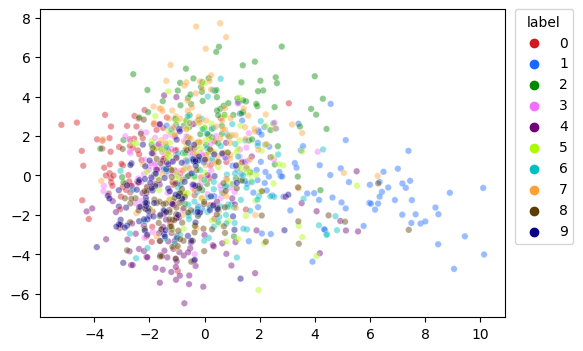

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.5762, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.2357104464752025, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.06273333333333332, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.1318, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.2668066666666667, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 1.69 s (started: 2022-11-24 16:44:15 -08:00)


In [43]:
mugspectralu.run("s1k")["evaluations"]

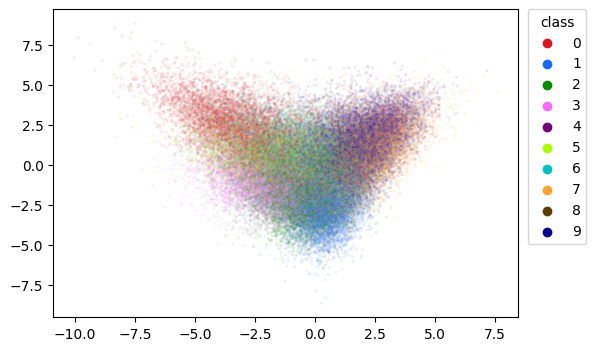

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.6314342857142857, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.4033208321993619, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.0017838095238095239, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.004430285714285715, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.011102857142857143, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 23.3 s (started: 2022-11-24 16:44:28 -08:00)


In [45]:
mugspectralu.run("mnist")["evaluations"]

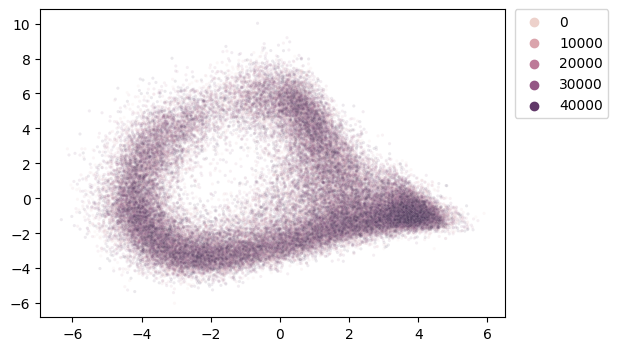

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.814472, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.7631146500316183, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.004245333333333334, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.0116196, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.03202333333333333, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 14.8 s (started: 2022-11-24 16:44:52 -08:00)


In [46]:
mugspectralu.run("mammoth")["evaluations"]

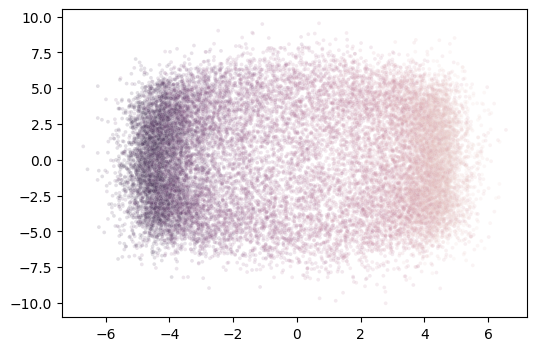

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.7757200000000001, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.7167238700958076, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.010846666666666668, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.028406, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.07407366666666666, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 5.1 s (started: 2022-11-24 16:45:07 -08:00)


In [47]:
mugspectralu.run("isoswiss")["evaluations"]

Alas, it looks like union is not useful with mid-near neighbors either.

In [2]:
umap_spectral = pl.create_pipeline(
    method=pl.embedder("umap", params=dict(a=1, b=1)),
    eval_metrics=pl.standard_metrics(),
)

time: 287 ms (started: 2022-11-24 20:35:38 -08:00)


## Initializing UMAP with bgspectral

I've talked a big game about these initializations looking similar to the standard UMAP initialization with metrics to back that up, so now is the time to put that to the test and feed their output into UMAP. UMAP can take an arbitrary initialization so `drnb` supports that by letting you pass a list of embedders to the `method` parameter. I will only look at `bgspectral` rather than the UMAP combination methods because the results seem broadly similar.

First, here's a UMAP pipeline for comparison. This will use its standard spectral initialization. The only non-default setting will be using the Cauchy kernel (which you get with `a=1, b=1`) which is the closest to the PaCMAP kernel, which I want to compare the UMAP results to. The PaCMAP paper shows that the `mammoth` dataset is well-reproduced by its algorithm compared to other methods and is also featured in the README of the github repo, so it's fair to say that the PaCMAP authors consider reproducing it to be an important part of its appeal.

In [14]:
umap_spectral = pl.create_pipeline(
    pl.embedder("umap", params=dict(a=1, b=1)),
    eval_metrics=pl.standard_metrics(),
)

time: 2.16 ms (started: 2022-11-24 20:50:02 -08:00)


And while we are talking about PaCMAP, let's create that too.

In [6]:
pacmap = pl.create_pipeline(
    method=pl.embedder(
        "pacmap",
    ),
    eval_metrics=pl.standard_metrics(),
)

time: 105 ms (started: 2022-11-24 20:35:46 -08:00)


Next, using `bgspectral` with random neighbors as input to UMAP. The `global_weight=0.001` should give a spectral initialization that is failty unperturbed from how UMAP would produce the initialization, but for `mammoth`, the initialization should be much faster.

In [3]:
umap_from_brspectral = pl.create_pipeline(
    method=[
        pl.embedder(
            "bgspectral",
            params=dict(
                global_neighbors="random",
                n_global_neighbors=5,
                global_weight=0.001,
            ),
        ),
        pl.embedder("umap", params=dict(a=1, b=1)),
    ],
    eval_metrics=pl.standard_metrics(),
)

time: 4.58 ms (started: 2022-11-24 20:35:39 -08:00)


Next, the same method but using the tsvd-warmed method for the spectral embedding. Although this results in slightly different initialization coordinates, I hope that once UMAP starts optimizing, we get quite a similar result.

In [4]:
umap_from_tbrspectral = pl.create_pipeline(
    method=[
        pl.embedder(
            "bgspectral",
            params=dict(
                global_neighbors="random",
                n_global_neighbors=5,
                global_weight=0.001,
                tsvdw=True,
            ),
        ),
        pl.embedder("umap", params=dict(a=1, b=1)),
    ],
    eval_metrics=pl.standard_metrics(),
)

time: 6.74 ms (started: 2022-11-24 20:35:42 -08:00)


And then `bgspectral` but using mid-near pairs in the style of PaCMAP instead of random neighbors. I am hoping this will give a layout closer to PaCMAP than the nearest-neighbors-only spectral initialization.

In [5]:
umap_from_bmspectral = pl.create_pipeline(
    method=[
        pl.embedder(
            "bgspectral",
            params=dict(
                global_neighbors="mid_near",
                n_global_neighbors=5,
                global_weight=0.01,
            ),
        ),
        pl.embedder("umap", params=dict(a=1, b=1)),
    ],
    eval_metrics=pl.standard_metrics(),
)

time: 3.17 ms (started: 2022-11-24 20:35:44 -08:00)


### mammoth

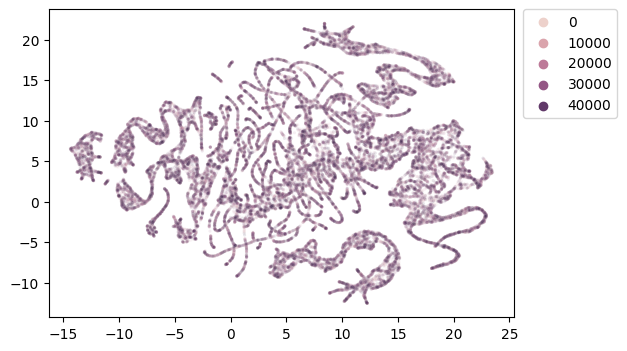

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.7481720000000002, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.6970701541356417, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.6413693333333332, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.6535428, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.6251794666666667, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 1min 17s (started: 2022-11-24 20:18:16 -08:00)


In [20]:
umap_spectral.run("mammoth")["evaluations"]

This is what we expect from UMAP: it's a bit slow to generate the result and the resulting mammoth looks a bit weird, like it's been spatchcocked.

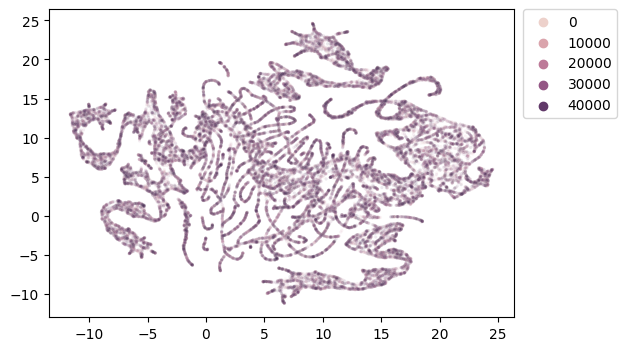

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.742676, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.6561510760346148, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.6559413333333332, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.6697064, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.6424949333333334, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 45.5 s (started: 2022-11-24 20:19:34 -08:00)


In [21]:
umap_from_brspectral.run("mammoth")["evaluations"]

The `bgspectral` initialization also looks weird in the same way as the UMAP spectral initialization, but that's what I was hoping to see, as this helps prove that you get a very similar result with `bgspectral`. Also, it's still faster to produce the result.

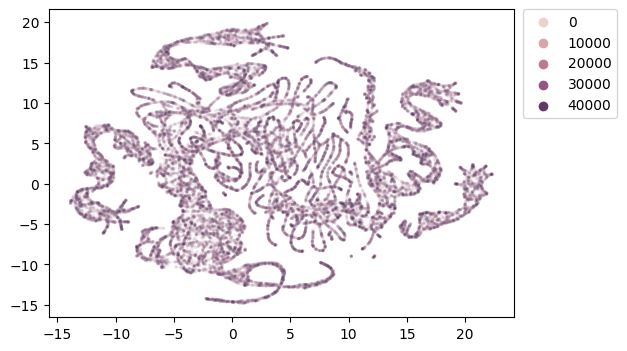

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.725036, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.6171126065971019, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.64302, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.651466, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.6256773333333333, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 25.2 s (started: 2022-11-24 20:29:22 -08:00)


In [29]:
umap_from_tbrspectral.run("mammoth")["evaluations"]

The tsvd-warmed initialization speeds things up even further. But visually it doesn't look quite as good as I had hoped. Certainly better than a random initialization, but you'd probably prefer to spend the extra time with the initialization. Metrics are slightly off, but not by much. What if we set the tolerance to be a bit tighter?

In [30]:
umap_from_tbrspectraltol = pl.create_pipeline(
    method=[
        pl.embedder(
            "bgspectral",
            params=dict(
                global_neighbors="random",
                n_global_neighbors=5,
                global_weight=0.001,
                tsvdw=True,
                tsvdw_tol=1e-6,
            ),
        ),
        pl.embedder("umap", params=dict(a=1, b=1)),
    ],
    eval_metrics=pl.standard_metrics(),
)

time: 3.58 ms (started: 2022-11-24 20:29:48 -08:00)


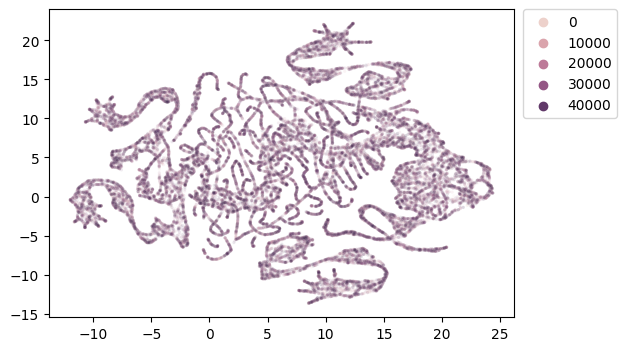

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.7352160000000001, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.6441369169212613, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.644824, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.6605759999999999, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.636694, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 40.7 s (started: 2022-11-24 20:29:48 -08:00)


In [31]:
umap_from_tbrspectraltol.run("mammoth")["evaluations"]

This seems closer, but the speed difference is not so large. Oh well.

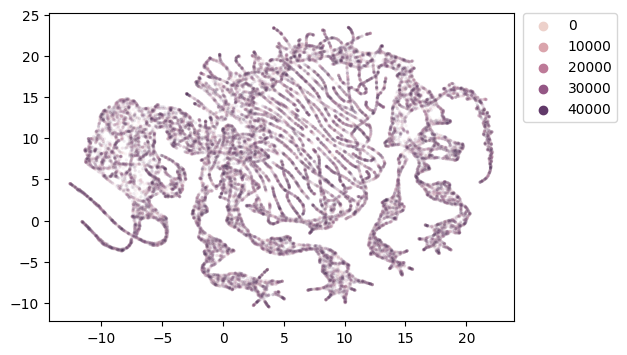

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.8446560000000001, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.8280603260382349, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.641996, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.647814, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.6355484, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 26.3 s (started: 2022-11-24 20:20:19 -08:00)


In [22]:
umap_from_bmspectral.run("mammoth")["evaluations"]

Now this is a mammoth that looks like a mammoth. And no PCA needed. I am rather pleased with this result.

[20:36:15] INFO     Loading faiss with AVX2 support.                                                   ]8;id=175016;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py\loader.py]8;;\:]8;id=561635;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py#54\54]8;;\

           INFO     Could not load library with AVX2 support due to:                                   ]8;id=299983;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py\loader.py]8;;\:]8;id=109419;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py#58\58]8;;\
                    ModuleNotFoundError("No module named 'faiss.swigfaiss_avx2'")                                  

           INFO     Loading faiss.                                                                     ]8;id=677180;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py\loader.py]8;;\:]8;id=652709;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py#64\64]8;;\

           INFO     Successfully loaded faiss.                                                         ]8;id=937733;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py\loader.py]8;;\:]8;id=769116;file:///home/james/dev/drnb/venv/lib/python3.10/site-packages/faiss/loader.py#66\66]8;;\

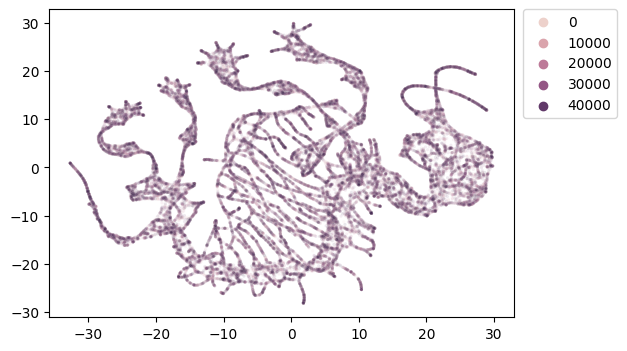

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.8478800000000002, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.8361241716693729, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.599704, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.6036548, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.6132201333333333, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 23.4 s (started: 2022-11-24 20:35:57 -08:00)


In [7]:
pacmap.run("mammoth")["evaluations"]

And here's PaCMAP as a comparison. Not too different from the UMAP result, and the metrics are very similar.

### mnist

Let's repeat the above but using MNIST. In terms of run-time, MNIST doesn't have a convergence issue with the spectral embedding, so I am only going to be looking to make sure that nothing really horrible happens to the output. If the mid-near pair setting for `bgspectral` also makes the results resemble PaCMAP, that would be great too.

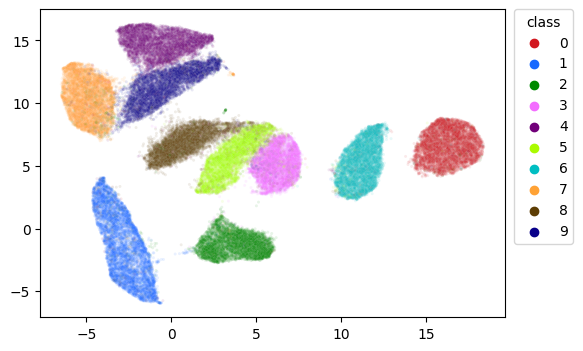

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.6164857142857143, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.3581221382006139, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.10781333333333333, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.172106, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.25933942857142855, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 36.4 s (started: 2022-11-24 20:37:15 -08:00)


In [8]:
umap_spectral.run("mnist")["evaluations"]

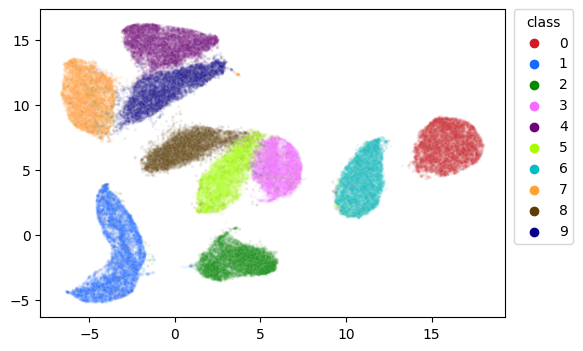

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.6149885714285714, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.3538460346706215, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.10500571428571429, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.1694874285714286, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.25700390476190477, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 32.7 s (started: 2022-11-24 20:38:58 -08:00)


In [10]:
umap_from_brspectral.run("mnist")["evaluations"]

The twistiness of the `1` cluster aside (which happens a lot to this cluster), the `bgspectral` with random neighbors is very much in line with the UMAP spectral results, as hoped.

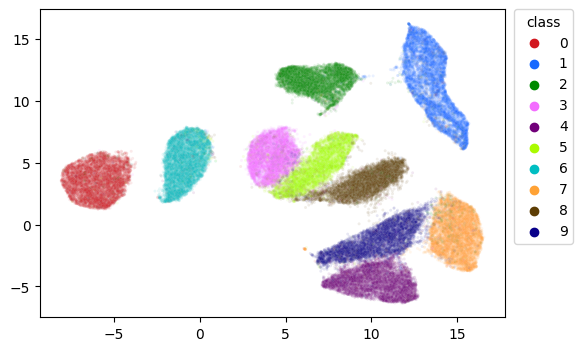

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.6163971428571428, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.35776610951575405, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.10719333333333332, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.17197885714285718, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.25957504761904765, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 27.9 s (started: 2022-11-24 20:40:07 -08:00)


In [11]:
umap_from_tbrspectral.run("mnist")["evaluations"]

And using the tsvd-warmed algorithm with the default tolerance also produces good results (so no need to re-run this with the tighter tolerance). The speed-up remains, although it's not so important here.

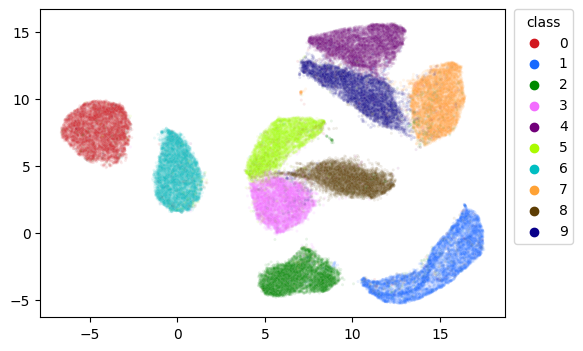

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.6163685714285715, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.3553771970723737, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.10616857142857145, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.17067200000000002, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.2582354285714286, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 41.4 s (started: 2022-11-24 20:41:07 -08:00)


In [12]:
umap_from_bmspectral.run("mnist")["evaluations"]

The metrics say there is no difference to the layout when using mid-near neighbors. But if you look at the central 3-5-8 cluster, it's taken up more of a trefoil shape compared to the spectral layout where they are closer to side-by-side.

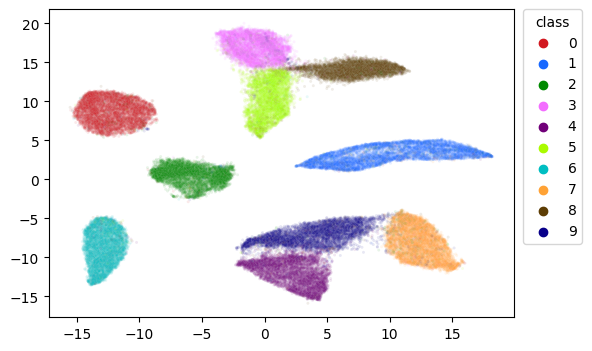

[EvalResult(eval_type='RTE', label='rte-5-euclidean', value=0.6157371428571429, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='RPC', label='rpc-5-euclidean', value=0.357567480129762, info={'metric': 'euclidean', 'ntpp': 5}),
 EvalResult(eval_type='NNP', label='nnp-15-noself-euclidean', value=0.0969, info={'metric': 'euclidean', 'n_neighbors': 15}),
 EvalResult(eval_type='NNP', label='nnp-50-noself-euclidean', value=0.16372228571428574, info={'metric': 'euclidean', 'n_neighbors': 50}),
 EvalResult(eval_type='NNP', label='nnp-150-noself-euclidean', value=0.25435800000000003, info={'metric': 'euclidean', 'n_neighbors': 150})]

time: 39.6 s (started: 2022-11-24 20:42:24 -08:00)


In [13]:
pacmap.run("mnist")["evaluations"]

The PaCMAP result moves the clusters around a bit more in terms of relative locations, but I will point out the 3-5-8 shape is closer to the mid-near `bgspectral` result than the random one.

## Conclusion

Based on all this, it seems that using binary edge weights for a spectral initialization gives results close to using the UMAP fuzzy set membership values, apart from some minor banding. Adding a small number of random neighbors with a lower weight (e.g. `1e-3`) does not seem to perturb the results while substantially speeding up the eigenvector calculation for cases which seem to have trouble converging, while not increasing the runtime of other datasets significantly. So that could be a useful default. Alternatively, a truncated SVD-warmed initializer can also help convergence, although there is more chance of a slightly different initial set of coordinates. These techniques can be combined.

If you start increasing the weight of the random edges then potentially some more global structure emerges, but there seems to be a very small window of the `global_weight` before the initialization becomes poor. Using the PaCMAP concept of "mid-near" pairs is more fruitful and can give something that seems to include a certain amount of global structure: for good (as `mammoth` shows) or ill (as `isoswiss` shows). This might be an interesting alternative to PCA, especially for datasets which aren't using the Euclidean metric.

UMAP weights and the UMAP concept of combination via fuzzy set intersection can also provide similar results, although union is not helpful. Whether using UMAP or binary edge weights, the `global_weight` parameter may need careful tuning per dataset. Embedding metrics may be helpful here: starting with `global_weight=0.0` and then increasing the weight, if the global metrics go up, while local metrics do not decrease, then useful global structure may be available for use in initialization.